In [1]:
import imufusion
import matplotlib.pyplot as plt
import numpy as np
import sys
import seaborn as sns

In [2]:
import imufusion

In [3]:
# !pip freeze | findstr imufusion

## Reading files and creating dataframes

In [4]:
import csv
import pandas as pd
import glob

# Define the path pattern to match all relevant files
file_pattern = 'WISDM/wisdm-dataset/wisdm-dataset/raw/phone/gyro/data_16*_gyro_phone.txt'

# List all files that match the pattern
file_paths = glob.glob(file_pattern)

# Define the columns and the activities to filter
columns = ['Subject-id', 'Activity', 'Timestamp', 'gyro_x', 'gyro_y', 'gyro_z']
activities_to_include = {'A', 'B', 'C', 'D', 'E'}

# Initialize a list to hold all DataFrames
dataframes = []

# Process each file
for file_path in file_paths:
    processed_list = []

    with open(file_path, 'r') as file:
        reader = csv.reader(file)
        next(reader)  # Skip the header row if there is one
        for i, line in enumerate(reader):
            try:
                # Strip any trailing spaces from all elements
                line = [element.strip() for element in line]
                
                # Remove trailing semicolon from the last element if it exists
                if line[-1].endswith(';'):
                    line[-1] = line[-1][:-1].strip()
                
                # Append the processed line to the processed list
                processed_list.append(line)
            except Exception as e:
                print(f'Error at line number: {i}, Error: {e}')

    # Create a DataFrame from the processed list
    df = pd.DataFrame(data=processed_list, columns=columns)
    
    # Filter the DataFrame for the specified activities
    df = df[df['Activity'].isin(activities_to_include)]
    
    # Append the filtered DataFrame to the list
    dataframes.append(df)

# Concatenate all the DataFrames into one
gyro_data = pd.concat(dataframes, ignore_index=True)

# Display the first few rows of the concatenated DataFrame
# print(gyro_data.head())


In [5]:
gyro_data

,Subject-id,Activity,Timestamp,gyro_x,gyro_y,gyro_z
0,1600,A,252207968934806,-0.8751373,0.015472412,0.16223145
1,1600,A,252208019288809,-0.72016907,0.38848877,-0.28401184
2,1600,A,252208069642813,-0.57164,1.2274017,-0.2416687
3,1600,A,252208119996817,-0.38049316,1.2028351,-0.21313477
4,1600,A,252208170350821,-0.2257843,0.558136,0.1244812
...,...,...,...,...,...,...
1006693,1650,E,357079483293000,-0.043675844,-0.02876214,-0.0031957934
1006694,1650,E,357079523599000,-0.25246766,-0.17044231,0.010652645
1006695,1650,E,357079563887000,-0.25033715,-0.221575,0.08522116
1006696,1650,E,357079604193000,0.046871636,-0.16192019,0.08735169


In [6]:
# Define the path pattern to match all relevant files
file_pattern = 'WISDM/wisdm-dataset/wisdm-dataset/raw/phone/accel/data_16*_accel_phone.txt'

# List all files that match the pattern
file_paths = glob.glob(file_pattern)

# Define the columns and the activities to filter
columns = ['Subject-id', 'Activity', 'Timestamp', 'accel_x', 'accel_y', 'accel_z']
activities_to_include = {'A', 'B', 'C', 'D', 'E'}

# Initialize a list to hold all DataFrames
dataframes = []

# Process each file
for file_path in file_paths:
    processed_list = []

    with open(file_path, 'r') as file:
        reader = csv.reader(file)
        next(reader)  # Skip the header row if there is one
        for i, line in enumerate(reader):
            try:
                # Strip any trailing spaces from all elements
                line = [element.strip() for element in line]
                
                # Remove trailing semicolon from the last element if it exists
                if line[-1].endswith(';'):
                    line[-1] = line[-1][:-1].strip()
                
                # Append the processed line to the processed list
                processed_list.append(line)
            except Exception as e:
                print(f'Error at line number: {i}, Error: {e}')

    # Create a DataFrame from the processed list
    df = pd.DataFrame(data=processed_list, columns=columns)
    
    # Filter the DataFrame for the specified activities
    df = df[df['Activity'].isin(activities_to_include)]
    
    # Append the filtered DataFrame to the list
    dataframes.append(df)

# Concatenate all the DataFrames into one
accel_data = pd.concat(dataframes, ignore_index=True)

# Display the first few rows of the concatenated DataFrame
#print(accel_data.head())


In [7]:
accel_data

,Subject-id,Activity,Timestamp,accel_x,accel_y,accel_z
0,1600,A,252207717164786,-0.8797302,9.768784,1.0169983
1,1600,A,252207767518790,2.0014954,11.10907,2.619156
2,1600,A,252207817872794,0.45062256,12.651642,0.18455505
3,1600,A,252207868226798,-2.1643524,13.928436,-4.4224854
4,1600,A,252207918580802,-4.332779,13.361191,-0.7188721
...,...,...,...,...,...,...
1338011,1650,E,357079523549000,-8.461604,-3.3865578,-1.9303858
1338012,1650,E,357079543741000,-8.459209,-3.4057178,-1.3603711
1338013,1650,E,357079563837000,-8.571775,-3.4368532,-1.0083033
1338014,1650,E,357079584047000,-8.456815,-3.535049,-0.7448511


In [8]:
# Modifying DataTypes
gyro_data['Timestamp'] = gyro_data['Timestamp'].astype('float')
gyro_data['gyro_x'] = gyro_data['gyro_x'].astype('float')
gyro_data['gyro_y'] = gyro_data['gyro_y'].astype('float')
gyro_data['gyro_z'] = gyro_data['gyro_z'].astype('float')

accel_data['Timestamp'] = accel_data['Timestamp'].astype('float')
accel_data['accel_x'] = accel_data['accel_x'].astype('float')
accel_data['accel_y'] = accel_data['accel_y'].astype('float')
accel_data['accel_z'] = accel_data['accel_z'].astype('float')

In [9]:
# Inserting a Segment column to count the distinct combination of activities and subjects
gyro_data['Segment'] = (gyro_data['Subject-id'] + gyro_data['Activity']).ne((gyro_data['Subject-id'] + gyro_data['Activity']).shift()).cumsum()
accel_data['Segment'] = (accel_data['Subject-id'] + accel_data['Activity']).ne((accel_data['Subject-id'] + accel_data['Activity']).shift()).cumsum()

In [10]:
# Convert timestamps to datetime
accel_data['DateTime'] = pd.to_datetime(accel_data['Timestamp'])
gyro_data['DateTime'] = pd.to_datetime(gyro_data['Timestamp'])

# Merge datasets on Timestamp
merged_data = pd.merge(accel_data, gyro_data, on='DateTime', suffixes=('_accel', '_gyro'))

# Interpolate or fill missing values
merged_data.interpolate(method='linear', inplace=True)

# Compute magnitudes
merged_data['accel_magnitude'] = np.sqrt(merged_data['accel_x']**2 + merged_data['accel_y']**2 + merged_data['accel_z']**2)
merged_data['gyro_magnitude'] = np.sqrt(merged_data['gyro_x']**2 + merged_data['gyro_y']**2 + merged_data['gyro_z']**2)

merged_data.drop(columns=['Subject-id_gyro', 'Activity_gyro', 'Timestamp_gyro', 'Segment_gyro'], inplace=True)

In [11]:
merged_data

,Subject-id_accel,Activity_accel,Timestamp_accel,accel_x,accel_y,accel_z,Segment_accel,DateTime,gyro_x,gyro_y,gyro_z,accel_magnitude,gyro_magnitude
0,1600,A,2.522080e+14,-0.319443,13.318359,-0.232025,1,1970-01-03 22:03:27.968934806,-0.875137,0.015472,0.162231,13.324210,0.890182
1,1600,A,2.522080e+14,1.566452,9.515274,-0.017776,1,1970-01-03 22:03:28.019288809,-0.720169,0.388489,-0.284012,9.643367,0.866158
2,1600,A,2.522081e+14,-0.323746,5.262665,0.322342,1,1970-01-03 22:03:28.069642813,-0.571640,1.227402,-0.241669,5.282458,1.375388
3,1600,A,2.522081e+14,-1.811676,3.710510,1.373932,1,1970-01-03 22:03:28.119996817,-0.380493,1.202835,-0.213135,4.351752,1.279458
4,1600,A,2.522082e+14,-1.134049,4.538269,2.297546,1,1970-01-03 22:03:28.170350821,-0.225784,0.558136,0.124481,5.211590,0.614809
...,...,...,...,...,...,...,...,...,...,...,...,...,...
811902,1650,E,3.569249e+14,-8.044871,-4.294270,-1.810635,257,1970-01-05 03:08:44.889588000,-0.024501,0.007457,-0.013848,9.297263,0.029115
811903,1650,E,3.569249e+14,-8.090376,-4.291875,-1.889671,257,1970-01-05 03:08:44.929929000,-0.024501,-0.011718,-0.026632,9.351216,0.038038
811904,1650,E,3.569250e+14,-8.080796,-4.330195,-1.868115,257,1970-01-05 03:08:44.970362000,-0.019175,-0.002131,-0.026632,9.356266,0.032885
811905,1650,E,3.569250e+14,-8.035291,-4.332591,-1.781895,257,1970-01-05 03:08:45.010618000,-0.027697,-0.004261,-0.026632,9.301204,0.038659


## Applying Sensor fusion to calculate Orientation

In [12]:
timestamp = merged_data[['DateTime']]
accelerometer = merged_data[['accel_x','accel_y','accel_z']]
gyroscope = merged_data[['gyro_x','gyro_y','gyro_z']]

timestamp1 = timestamp.to_numpy()
accelerometer1 = accelerometer.to_numpy()
gyroscope1 = gyroscope.to_numpy()

# Process sensor data
sample_rate = 20
ahrs = imufusion.Ahrs()
ahrs.settings = imufusion.Settings(imufusion.CONVENTION_ENU, 0.5, 0, 10, 10, 5*sample_rate)
euler = np.empty((len(timestamp1), 3))

for index in range(len(timestamp1)):
    ahrs.update_no_magnetometer(gyroscope1[index], accelerometer1[index], 1 / 20)  # 20 Hz sample rate
    euler[index] = ahrs.quaternion.to_euler()

euler_df = pd.DataFrame(euler, columns=['Roll', 'Pitch', 'Yaw'])

merged_df = pd.concat([merged_data, euler_df], axis=1)

In [13]:
merged_df

,Subject-id_accel,Activity_accel,Timestamp_accel,accel_x,accel_y,accel_z,Segment_accel,DateTime,gyro_x,gyro_y,gyro_z,accel_magnitude,gyro_magnitude,Roll,Pitch,Yaw
0,1600,A,2.522080e+14,-0.319443,13.318359,-0.232025,1,1970-01-03 22:03:27.968934806,-0.875137,0.015472,0.162231,13.324210,0.890182,52.358906,1.086325,-5.337044e-08
1,1600,A,2.522080e+14,1.566452,9.515274,-0.017776,1,1970-01-03 22:03:28.019288809,-0.720169,0.388489,-0.284012,9.643367,0.866158,68.968681,-3.747721,-1.069504e-07
2,1600,A,2.522081e+14,-0.323746,5.262665,0.322342,1,1970-01-03 22:03:28.069642813,-0.571640,1.227402,-0.241669,5.282458,1.375388,77.119255,-0.331979,-1.334044e-08
3,1600,A,2.522081e+14,-1.811676,3.710510,1.373932,1,1970-01-03 22:03:28.119996817,-0.380493,1.202835,-0.213135,4.351752,1.279458,73.920296,10.959476,-4.348170e-07
4,1600,A,2.522082e+14,-1.134049,4.538269,2.297546,1,1970-01-03 22:03:28.170350821,-0.225784,0.558136,0.124481,5.211590,0.614809,69.002541,11.748578,-4.360212e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
811902,1650,E,3.569249e+14,-8.044871,-4.294270,-1.810635,257,1970-01-05 03:08:44.889588000,-0.024501,0.007457,-0.013848,9.297263,0.029115,-113.449486,59.569408,-1.631550e+02
811903,1650,E,3.569249e+14,-8.090376,-4.291875,-1.889671,257,1970-01-05 03:08:44.929929000,-0.024501,-0.011718,-0.026632,9.351216,0.038038,-113.456657,59.576733,-1.631596e+02
811904,1650,E,3.569250e+14,-8.080796,-4.330195,-1.868115,257,1970-01-05 03:08:44.970362000,-0.019175,-0.002131,-0.026632,9.356266,0.032885,-113.453552,59.579445,-1.631557e+02
811905,1650,E,3.569250e+14,-8.035291,-4.332591,-1.781895,257,1970-01-05 03:08:45.010618000,-0.027697,-0.004261,-0.026632,9.301204,0.038659,-113.426399,59.582836,-1.631308e+02


## EDA of dataframes per activity per subject

In [14]:
# Separating dataframes per activity
walking = merged_df[merged_df.Activity_accel=='A']
jogging = merged_df[merged_df.Activity_accel=='B']
stairs = merged_df[merged_df.Activity_accel=='C']
sitting = merged_df[merged_df.Activity_accel=='D']
standing = merged_df[merged_df.Activity_accel=='E']

In [15]:
walking

,Subject-id_accel,Activity_accel,Timestamp_accel,accel_x,accel_y,accel_z,Segment_accel,DateTime,gyro_x,gyro_y,gyro_z,accel_magnitude,gyro_magnitude,Roll,Pitch,Yaw
0,1600,A,2.522080e+14,-0.319443,13.318359,-0.232025,1,1970-01-03 22:03:27.968934806,-0.875137,0.015472,0.162231,13.324210,0.890182,52.358906,1.086325,-5.337044e-08
1,1600,A,2.522080e+14,1.566452,9.515274,-0.017776,1,1970-01-03 22:03:28.019288809,-0.720169,0.388489,-0.284012,9.643367,0.866158,68.968681,-3.747721,-1.069504e-07
2,1600,A,2.522081e+14,-0.323746,5.262665,0.322342,1,1970-01-03 22:03:28.069642813,-0.571640,1.227402,-0.241669,5.282458,1.375388,77.119255,-0.331979,-1.334044e-08
3,1600,A,2.522081e+14,-1.811676,3.710510,1.373932,1,1970-01-03 22:03:28.119996817,-0.380493,1.202835,-0.213135,4.351752,1.279458,73.920296,10.959476,-4.348170e-07
4,1600,A,2.522082e+14,-1.134049,4.538269,2.297546,1,1970-01-03 22:03:28.170350821,-0.225784,0.558136,0.124481,5.211590,0.614809,69.002541,11.748578,-4.360212e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
806806,1650,A,3.597864e+14,-7.776629,-4.809199,-0.723296,253,1970-01-05 03:56:26.444225000,1.236772,-0.210922,-0.167247,9.172105,1.265727,-109.688980,61.827854,-1.709451e+02
806807,1650,A,3.597865e+14,-5.022356,-4.854705,-0.601150,253,1970-01-05 03:56:26.484448000,1.221858,-0.605070,-0.288687,7.010963,1.393696,-109.109619,61.448032,-1.704734e+02
806808,1650,A,3.597865e+14,-5.944439,-4.083508,-2.483635,253,1970-01-05 03:56:26.524754000,1.490305,0.524110,0.182160,7.627571,1.590246,-109.479752,61.210403,-1.708768e+02
806809,1650,A,3.597866e+14,-7.220984,-3.173401,-2.945874,253,1970-01-05 03:56:26.565099000,1.100418,0.688161,0.153398,8.419695,1.306911,-110.095505,61.203682,-1.714815e+02


In [16]:
def plot_activity_per_subject(df):

    # Get unique subjects
    unique_subjects = df['Subject-id_accel'].unique()

    # Define number of rows and columns
    if (len(unique_subjects)%5 == 0):
        n_rows = len(unique_subjects)//5
        n_cols = 5
    else:
        n_rows = len(unique_subjects)//5 + 1
        n_cols = 5

    # Create a figure with subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 30), sharex=False, sharey=False)
    axes = axes.flatten()

    # Plot data for each subject
    for i, subject in enumerate(unique_subjects):
        if i >= n_rows * n_cols:
            break       # Only plot up to n_rows * n_cols subjects
        
        subject_data = df[df['Subject-id_accel'] == subject]
        ax = axes[i]
        ax.plot(subject_data['Timestamp_accel'], subject_data['accel_x'], label='accel_x')
        ax.plot(subject_data['Timestamp_accel'], subject_data['accel_y'], label='accel_y')
        ax.plot(subject_data['Timestamp_accel'], subject_data['accel_z'], label='accel_z')
        ax.set_title(f'Subject {subject}')
        ax.set_xlabel('DateTime')
        ax.set_ylabel('Acceleration')
        ax.legend(loc = 'lower right')

    df_1600 = df[df['Subject-id_accel'] == '1600']

    # Adjust layout
    plt.tight_layout()
    plt.show()

    return df_1600      # Returning final df for further plots


In [17]:
# Checking number of subjects per activity
len(walking['Subject-id_accel'].unique()), len(jogging['Subject-id_accel'].unique()), len(stairs['Subject-id_accel'].unique()), len(sitting['Subject-id_accel'].unique()), len(standing['Subject-id_accel'].unique())

(45, 44, 45, 47, 47)

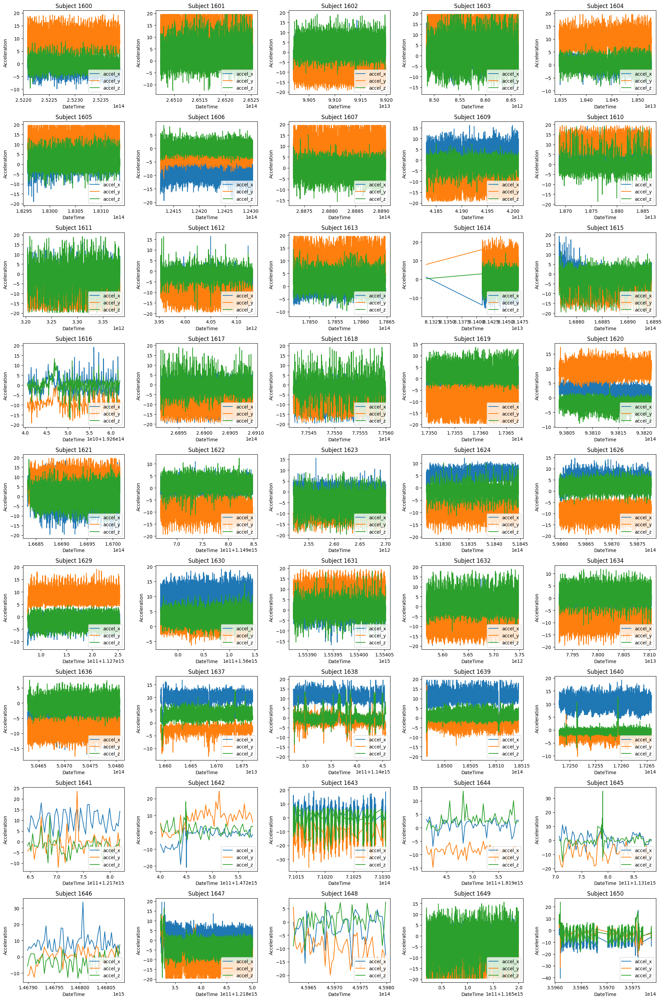

In [18]:
walking_1600 = plot_activity_per_subject(walking)

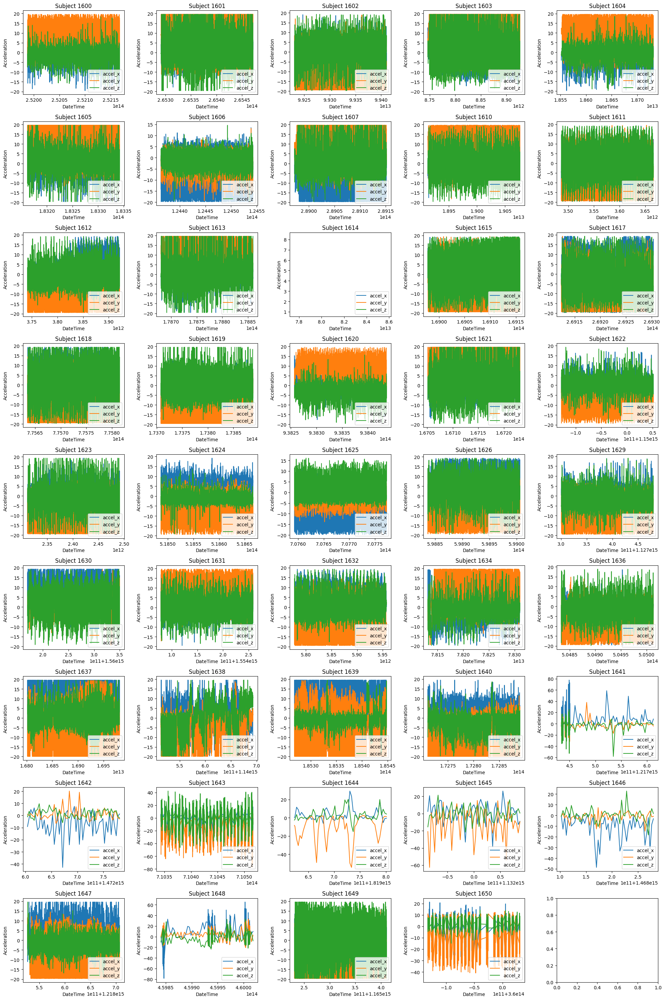

In [19]:
jogging_1600 = plot_activity_per_subject(jogging)

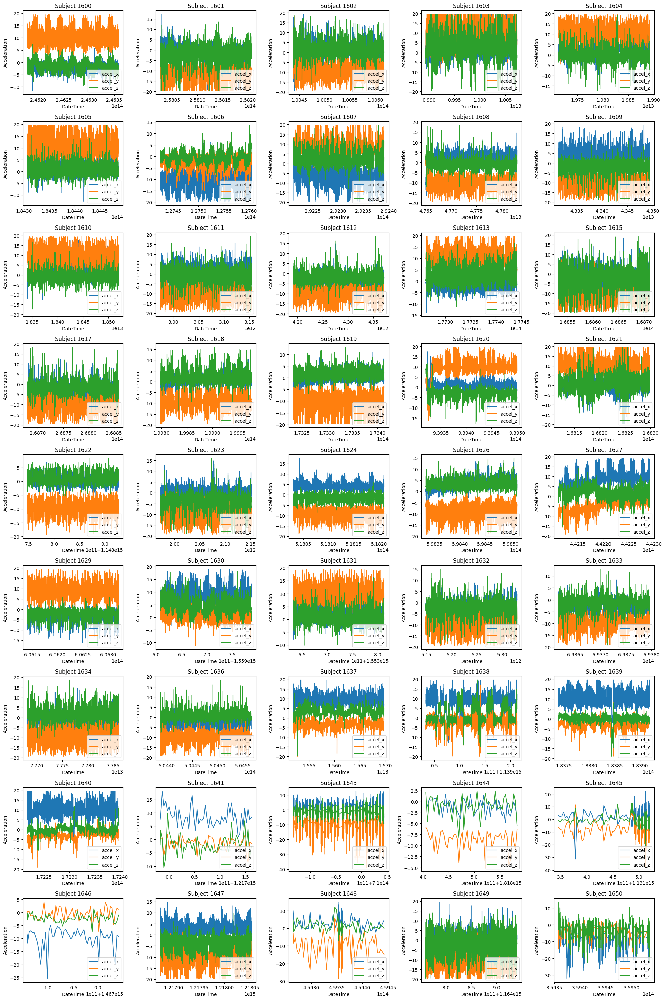

In [20]:
stairs_1600 = plot_activity_per_subject(stairs)

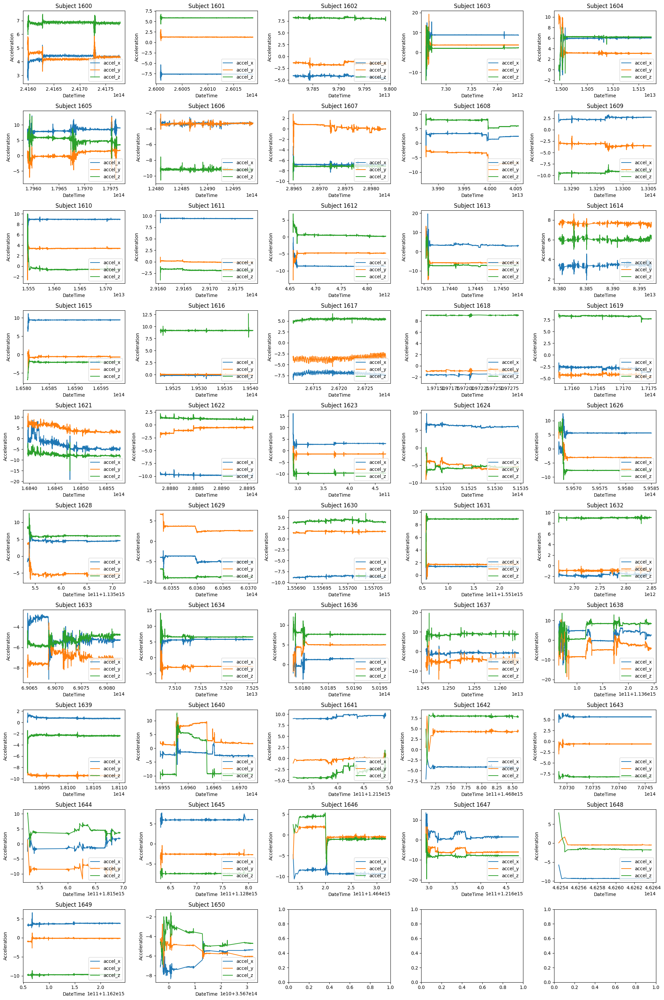

In [21]:
sitting_1600 = plot_activity_per_subject(sitting)

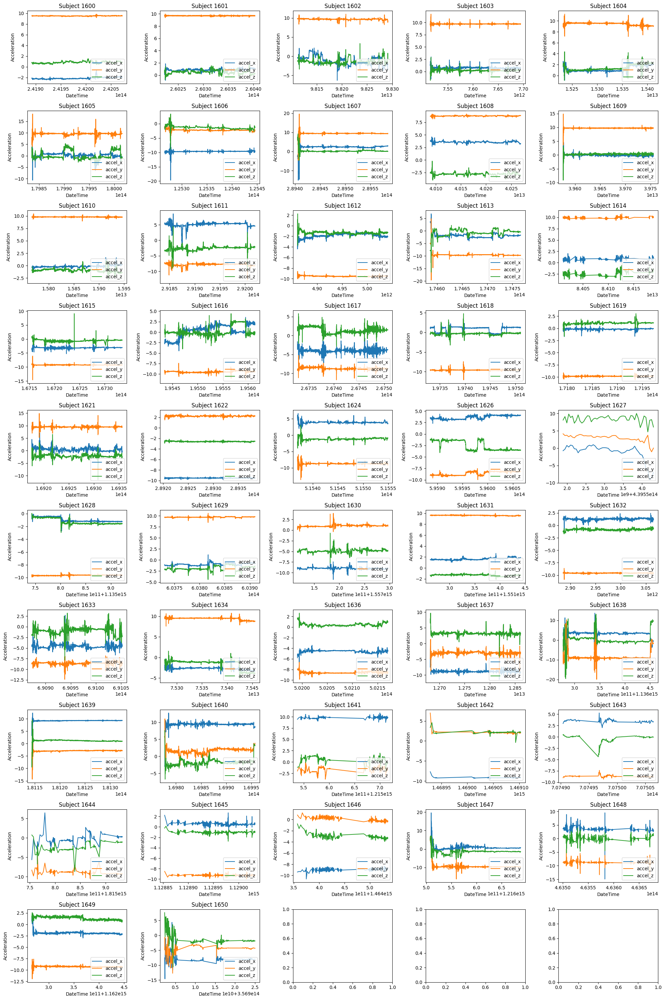

In [22]:
standing_1600 = plot_activity_per_subject(standing)

In [23]:
# Check the statistics of acceleration values per subject

selected_columns = ['accel_x', 'accel_y', 'accel_z']
desc_stats_walk = walking.groupby('Subject-id_accel')[selected_columns].describe(percentiles=[])

desc_stats_walk

accel_x                                             \
                    count       mean       std        min        50%   
Subject-id_accel                                                       
1600               3568.0  -1.859932  2.027140 -10.639038  -1.578003   
1601               4511.0   2.961514  3.365571  -6.649297   2.556409   
1602               3568.0   0.809382  2.782803 -15.131424   0.559158   
1603               4509.0   1.113126  4.417323 -15.161283   1.435922   
1604               3568.0   0.112412  2.154569  -9.043106   0.210587   
1605               4510.0  -0.523749  2.724386 -18.944120  -0.711976   
1606               3567.0  -9.394196  2.590583 -19.726135  -9.593140   
1607               4510.0   2.229853  3.610182  -5.420473   1.262941   
1609               3568.0   3.412037  3.693749  -3.770538   2.923119   
1610               3568.0   4.000821  4.337065 -11.700699   4.094246   
1611               3567.0  -2.865059  4.815865 -17.822190  -2.960648   
1612               3568.0  -3.196781  3.913553 -19.543640  -3.033546   
1613               4509.0  -1.625806  1.551258  -8.608951  -1.564012   
1614               3145.0  -1.133815  4.028050 -17.907562  -0.397573   
1615               3568.0  -0.934567  3.781880 -19.554947  -0.832108   
1616                429.0   0.279129  4.421943  -8.259018  -0.301773   
1617               3568.0  -2.382552  5.062014 -19.749252  -1.449585   
1618               3568.0  -6.297664  5.355678 -19.742340  -6.347122   
1619               4509.0  -0.300886  2.451012  -7.268198  -0.585382   
1620               3567.0   2.486779  1.894582  -2.799240   2.507217   
1621               4511.0   1.261795  6.058746 -19.613300   0.872088   
1622               3568.0  -0.408070  2.287807  -6.664047  -0.651863   
1623               3568.0   0.561597  2.516141 -12.226105   0.512611   
1624               3565.0   4.799680  2.008414  -0.715256   4.456528   
1626               3568.0   3.357537  2.891863  -4.621216   3.193382   
1629              14274.0  -2.078894  2.126326 -11.597717  -2.180099   
1630               3568.0   9.032308  3.438439   0.577194   8.629188   
1631               3567.0   0.468098  4.141903 -17.087906   0.213943   
1632               3569.0   0.239165  4.959344 -19.718369   0.699478   
1634               3568.0  -1.106811  1.957280  -9.780090  -1.037964   
1636               3568.0  -4.312002  2.716192 -16.880142  -3.374123   
1637               3597.0   9.872127  2.214257  -0.371401  10.167875   
1638               3598.0   9.773948  4.952654 -14.321217  10.613197   
1639               3614.0  10.791333  3.281033 -10.211570  10.706571   
1640               3598.0  10.035487  2.824430  -0.272939  10.149020   
1641                 55.0  10.000165  4.352735   1.573528   9.611214   
1642                 96.0  -1.859408  4.936494 -20.822300  -0.566422   
1643               1900.0   2.247761  3.851945  -9.201666   2.070495   
1644                 55.0   0.874313  2.327939  -6.979087   1.348396   
1645                134.0   2.494073  3.765585  -9.685459   2.797383   
1646                 55.0   8.564460  5.763785  -1.017883   7.295230   
1647               4509.0   1.877753  2.712892 -10.328587   1.606509   
1648                 56.0  -2.229977  5.022873 -16.710052  -0.462239   
1649               4510.0   0.011670  3.716030 -19.613300  -0.036512   
1650               1958.0  -8.197364  3.907056 -40.593190  -8.158634   

                             accel_y                                  \
                        max    count       mean       std        min   
Subject-id_accel                                                       
1600               5.301727   3568.0   9.547649  3.653403   0.962326   
1601              19.612701   4511.0   9.076354  4.925200 -12.584522   
1602              16.171036   3568.0  -9.751212  4.235292 -19.360977   
1603              16.897078   4509.0   9.815804  4.988102  -5.786187   
1604              13.096878   3568.0   9.822908  3.664693

In [24]:
# Function to plot boxplots of accelerations in the 3 axes for each subject 

def plot_accel(df, df_name):
    # Set up the figure with subplots
    fig, axs = plt.subplots(3, 1, figsize=(18, 18), sharex=True)

    # Add a main title to the entire figure using the DataFrame name
    fig.suptitle(f'{df_name}', fontsize=16)

    # Plot for accel_x
    sns.boxplot(x='Subject-id_accel', y='accel_x', data=df, ax=axs[0])
    axs[0].set_xlabel('')
    axs[0].set_ylabel('accel_x')

    # Plot for accel_y
    sns.boxplot(x='Subject-id_accel', y='accel_y', data=df, ax=axs[1])
    axs[1].set_xlabel('')
    axs[1].set_ylabel('accel_y')

    # Plot for accel_z
    sns.boxplot(x='Subject-id_accel', y='accel_z', data=df, ax=axs[2])
    axs[2].set_xlabel('Subject-id_accel')
    axs[2].set_ylabel('accel_z')

    # Adjust layout to make room for the main title
    plt.tight_layout(rect=[0, 0, 1, 0.98])

    # Show the plots
    plt.show()


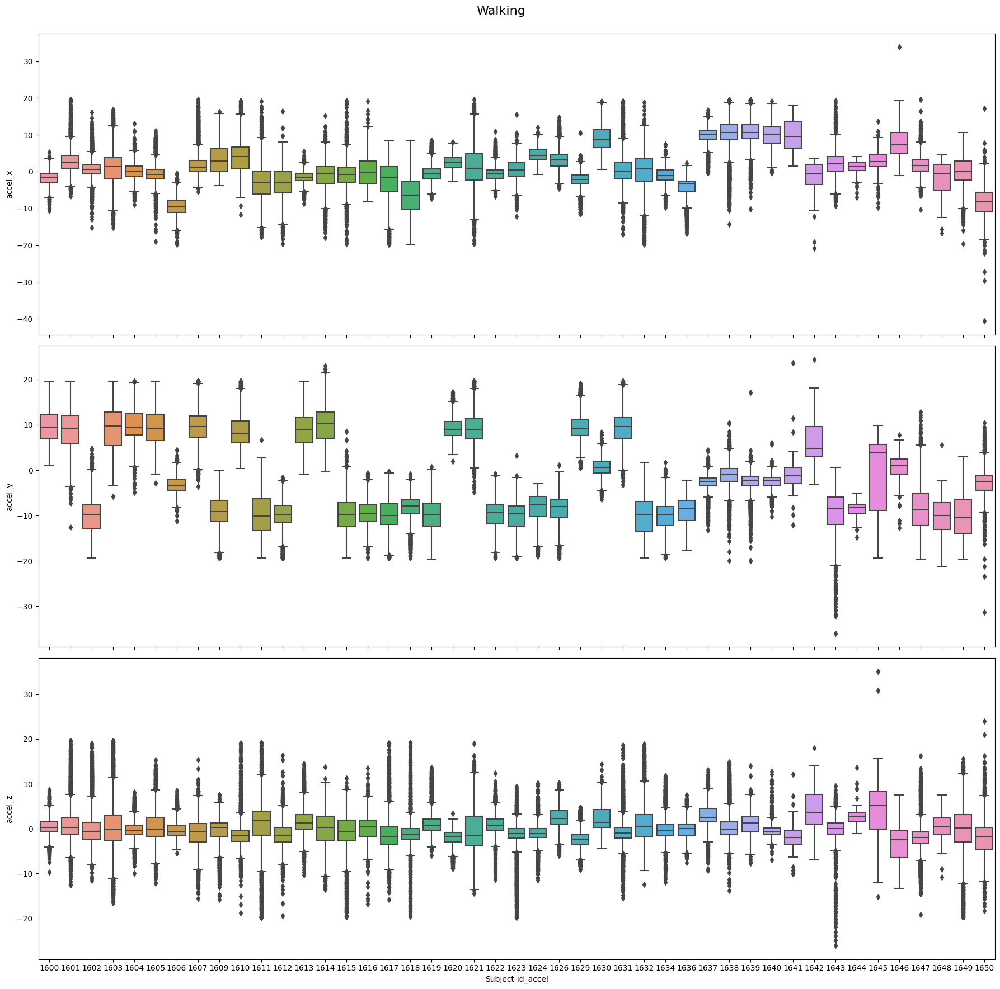

In [25]:
plot_accel(walking, 'Walking')

In [26]:
# Check the statistics of acceleration values per subject
selected_columns = ['accel_x', 'accel_y', 'accel_z']
desc_stats_jog = jogging.groupby('Subject-id_accel')[selected_columns].describe(percentiles=[])

desc_stats_jog

accel_x                                             \
                    count       mean        std        min       50%   
Subject-id_accel                                                       
1600               3569.0  -1.071180   3.543143 -19.566513 -1.140762   
1601               4510.0   1.898086   5.943487 -19.613300  1.789965   
1602               3569.0   0.734773   4.416307 -19.564468  0.873703   
1603               4511.0   2.155451   7.057655 -17.192762  2.277484   
1604               3569.0  -0.755252   4.481164 -19.724915 -0.249649   
1605               4510.0  -0.247470   4.379748 -19.613300  0.207098   
1606               3569.0  -7.600250   8.281275 -19.749252 -9.632080   
1607               4510.0  -4.265789   5.740283 -19.613300 -2.729091   
1610               3270.0   5.618968   8.211240 -17.745285  4.625496   
1611               3569.0  -1.603560   7.059987 -19.749252 -1.196670   
1612               3569.0   1.237236   7.085144 -19.234833  1.306900   
1613               4510.0  -0.855315   3.267603 -19.613300 -0.673669   
1614                  1.0   0.924478        NaN   0.924478  0.924478   
1615               3569.0  -0.911899   7.483864 -19.749252 -1.025085   
1617               3569.0  -3.419065  11.197901 -19.749252 -6.247177   
1618               3569.0  -0.931295   9.763064 -19.749252 -2.609039   
1619               4511.0  -2.935266   5.650579 -19.613300 -2.430115   
1620               3569.0   1.163392   3.450491 -19.414260  0.927521   
1621               4510.0   0.097899   3.988545 -16.931196  0.138564   
1622               3568.0  -0.659360   3.669762 -19.297104 -0.861885   
1623               3569.0   0.691835   5.238122 -19.475647  0.983170   
1624               3568.0   3.531209   4.703973  -8.859894  2.890511   
1625               3567.0  -6.731540   7.225373 -19.749252 -6.531647   
1626               8414.0   4.603249   6.459689 -11.363815  4.588524   
1629              14280.0   0.133254   5.200942 -19.139725  0.717987   
1630               3569.0   5.404101   7.493846 -18.901657  3.887650   
1631               3569.0   2.644500   5.983914 -19.489655  2.916611   
1632               3569.0   2.089545   6.085717 -16.567780  1.789642   
1634               3569.0  -2.185789   5.680696 -19.749252 -2.509842   
1636               3569.0  -4.215029   6.306833 -19.749252 -2.768784   
1637               3598.0   4.909007  10.723979 -19.673454  6.817190   
1638               3599.0   0.124239   6.157685 -19.715353 -0.391751   
1639               3599.0   5.595731   9.766951 -19.714155  6.291663   
1640               3599.0  -1.966346   7.100054 -19.725828 -3.658340   
1641                292.0   9.060458  14.295363 -16.269370  4.330196   
1642                 56.0  -7.154736   9.994935 -42.863667 -6.345605   
1643               2195.0   0.183751   7.033346 -43.879154  0.993933   
1644                 57.0   3.196679   6.273721  -6.195916  1.551973   
1645                 55.0   0.880845  11.982003 -38.926254  1.927991   
1646                 55.0 -10.843256  10.969287 -48.642850 -7.929910   
1647               4511.0   1.908711   5.436865 -17.337013  1.286285   
1648                653.0   5.809650  15.155142 -78.477610  3.051255   
1649               4511.0  -0.278782   6.125270 -19.613300 -0.281319   
1650               1896.0  -1.611320   7.110781 -33.887135 -0.583187   

                             accel_y                                   \
                        max    count       mean        std        min   
Subject-id_accel                                                        
1600              14.439133   3569.0   8.403181   7.627909  -9.483810   
1601              19.612701   4510.0   8.472193   9.640747 -14.055161   
1602              19.044586   3569.0  -8.939611   8.976363 -19.386353   
1603              19.612701   4511.0   7.287494   9.368065 -12.397177   
1604              18.125748   3569.0   8.748080   7.190325 -12.615936   
1605              15.249270   4510.0   7.732515  

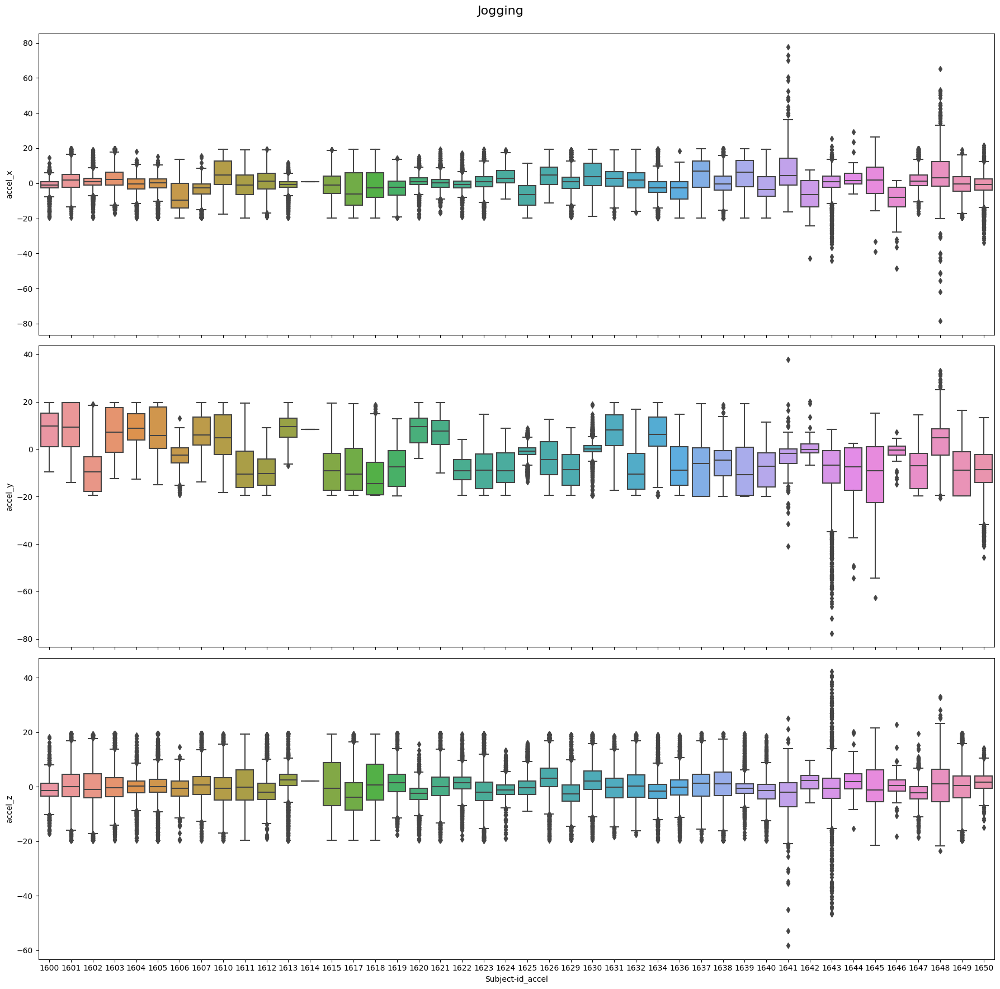

In [27]:
plot_accel(jogging, 'Jogging')

In [28]:
# Check the statistics of acceleration values per subject
selected_columns = ['accel_x', 'accel_y', 'accel_z']
desc_stats_stairs = stairs.groupby('Subject-id_accel')[selected_columns].describe(percentiles=[])

desc_stats_stairs

accel_x                                                      \
                    count      mean       std        min       50%        max   
Subject-id_accel                                                                
1600               3566.0 -1.817469  1.550225 -11.571808 -1.685402   5.869797   
1601               4510.0 -0.495394  2.510944 -19.320011 -0.476446  17.228676   
1602               3569.0  1.073778  2.977711 -19.272583  1.010834  19.215164   
1603               4510.0  3.565106  3.851349 -15.060726  3.680487  19.612701   
1604               3569.0  2.834788  2.771523 -13.368790  2.703278  19.188416   
1605               4510.0  1.269726  2.142090 -12.836513  1.151312  10.652402   
1606               3569.0 -9.278334  3.762911 -19.749252 -8.765595  10.616180   
1607               4511.0 -5.937850  3.359373 -19.613300 -5.626374   2.650381   
1608               3570.0  1.935426  2.827502 -16.684036  2.117851  14.610428   
1609               3569.0  4.312913  2.489194 -15.450699  4.016785  19.228561   
1610               3569.0  3.675590  3.158259 -18.849747  3.323029  19.209122   
1611               3569.0  0.506660  3.112585 -11.276581  0.315445  15.823120   
1612               3569.0 -2.696566  2.816913 -18.945755 -2.443878  14.741821   
1613               4509.0 -1.464413  1.923714 -13.755287 -1.367688   6.362591   
1615               3569.0 -1.278411  4.181402 -19.105667 -1.251526  18.439697   
1617               3569.0 -2.598531  3.566089 -18.910690 -2.313141  12.325501   
1618               3568.0  0.355461  1.996304 -13.097427  0.396263  10.497131   
1619               4511.0 -0.015771  2.068997 -11.596914  0.002394  10.969634   
1620               3569.0  1.209407  1.968671  -6.540054  1.140366  17.498749   
1621               4510.0 -0.035341  2.745259 -19.613300 -0.036212  19.612701   
1622               3569.0  0.170175  1.495921  -6.698486  0.153519   6.877533   
1623               3569.0  0.597497  1.875937  -7.270523  0.544510  15.423477   
1624               3569.0  3.764342  1.569041  -0.632736  3.528641  17.603302   
1626               3569.0  2.961176  2.112752 -10.374924  2.790115  13.315384   
1627               3565.0  7.599211  3.416312  -4.589157  7.481934  19.250153   
1629              14276.0 -3.524483  2.454677 -17.558304 -3.329452   4.893005   
1630               3568.0  7.973747  2.786639  -3.310944  7.627037  19.053787   
1631               3568.0  1.955729  2.491210  -7.810730  1.921196  16.703003   
1632               3569.0 -2.031387  2.648334 -16.150772 -2.054977   8.791931   
1633               3570.0 -3.334410  2.289674 -13.364212 -3.329147   8.308228   
1634               3569.0 -0.983334  2.600418 -18.154572 -1.140762  14.668366   
1636               3569.0 -2.409509  2.645516 -15.620529 -2.280914   6.417343   
1637               3598.0  8.579500  2.646848  -2.171840  8.136395  19.552547   
1638               3598.0  7.247543  4.883862 -12.839206  8.180688  19.510649   
1639               3598.0  9.565910  3.175049  -1.975516  9.242517  19.511847   
1640               3599.0  9.057282  3.578579  -6.387730  8.822633  19.500174   
1641                 57.0  8.490008  3.467232   0.919687  8.303533  18.156643   
1643               2242.0  2.197536  2.171990  -6.643784  2.033372  12.655284   
1644                 56.0 -1.258326  1.612713  -4.845125 -1.132844   1.609453   
1645                528.0  2.752259  4.179842 -31.456188  3.023712  22.266497   
1646                 57.0 -9.862943  3.910627 -25.310568 -9.034014  -4.938530   
1647               4509.0  2.823909  2.109411  -4.167108  2.653374  14.811728   
1648                190.0  3.644539  3.588794  -4.054768  3.420088  14.944922   
1649               4511.0  0.400363  2.908575 -16.831837  0.439336  19.612701   
1650               2392.0 -7.910799  3.871408 -32.011833 -7.328760   4.114644   

                  accel_y                                                      \
                    count      mean       std   

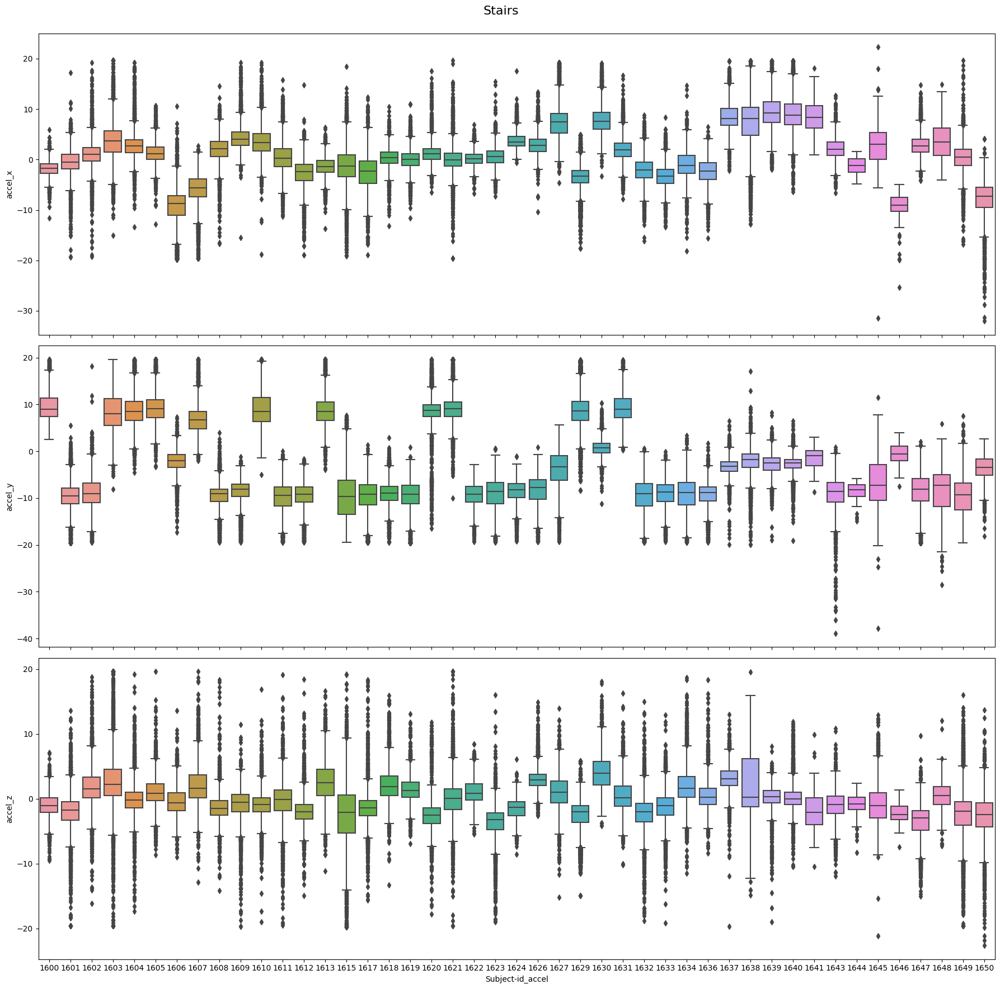

In [29]:
plot_accel(stairs, 'Stairs')

In [30]:
# Check the statistics of acceleration values per subject
selected_columns = ['accel_x', 'accel_y', 'accel_z']
desc_stats_sitting = sitting.groupby('Subject-id_accel')[selected_columns].describe(percentiles=[])

desc_stats_sitting

accel_x                                                      \
                    count      mean       std        min       50%        max   
Subject-id_accel                                                                
1600               3569.0  4.340529  0.169523   2.627441  4.391434   5.207489   
1601               4511.0 -7.609986  0.074994  -9.090185 -7.609970  -5.345654   
1602               3569.0 -4.246295  0.195597  -5.090607 -4.202682  -2.992493   
1603               4510.0  8.629606  1.350412 -11.763910  8.803479  15.744270   
1604               3569.0  5.833976  0.976949  -1.158005  6.008667   7.964050   
1605               4511.0  8.217701  0.645975   0.399832  8.336012  12.902353   
1606               3569.0 -3.371069  0.112057  -4.068512 -3.362778  -2.557221   
1607               4511.0 -6.870980  0.158139  -8.316858 -6.870162  -3.320758   
1608               3568.0  2.750140  0.701457  -2.972748  3.197426   4.458954   
1609               3568.0  2.477606  0.253274   1.463455  2.418259   3.451492   
1610               3568.0  8.902893  0.300679   0.171265  8.923592   9.919144   
1611               3569.0  9.420600  0.039257   8.470093  9.419022  10.446320   
1612               3570.0 -8.552596  0.604755  -9.203888 -8.663918  -0.114914   
1613               4511.0  3.398413  0.858733  -4.894347  3.293224  19.612701   
1614               3324.0  3.392633  0.141338   1.896856  3.408113   4.562512   
1615               3569.0  9.369574  0.184461   6.285873  9.386490  11.120697   
1616               3568.0 -0.160428  0.046812  -1.096512 -0.160019   0.433334   
1617               3570.0 -6.995502  0.274647  -8.502213 -7.005722  -6.151077   
1618               1629.0 -1.573648  0.121098  -2.517929 -1.600510  -0.981628   
1619               4511.0 -2.827604  0.349422  -4.535216 -2.734178  -1.651401   
1621               4510.0 -3.045639  2.600157 -19.234417 -4.226365   9.819819   
1622               3569.0 -9.767044  0.087689 -10.672852 -9.792038  -8.691574   
1623               3569.0  2.944421  0.407771   0.442444  3.085571  16.094833   
1624               3570.0  6.171508  0.303518   4.267105  6.143181   9.761551   
1626               3569.0  5.426725  1.167722  -2.371903  5.616333  12.587250   
1628               3567.0  4.406191  0.841703  -3.086914  4.495514   7.233627   
1629              14276.0 -4.548506  0.671493  -6.730713 -5.014236  -2.324936   
1630               3569.0 -8.672557  0.133114  -9.357727 -8.675171  -7.712250   
1631               3569.0  1.368532  0.168154  -0.681778  1.373047   8.274826   
1632               3570.0 -1.729127  0.217524  -2.602112 -1.733444  -0.808639   
1633               3568.0 -4.894000  0.983680  -9.135422 -5.257195  -2.645218   
1634               3569.0  5.662941  0.452012  -4.141159  5.773361   9.486130   
1636               3569.0  1.240148  0.662557  -3.759964  1.459106   9.207291   
1637               3598.0 -0.812982  0.504395 -11.692982 -0.751480   3.115156   
1638               3599.0  2.456371  3.031426 -12.646921  3.926192   9.765201   
1639               3599.0  0.782622  0.125883  -0.025438  0.756268   1.686416   
1640               3599.0 -2.066201  0.917454  -5.959766 -2.327763   9.566631   
1641               4256.0  9.387545  0.360736   8.715476  9.513018  10.277029   
1642               3216.0 -4.178463  0.100450  -7.084468 -4.167334  -1.817820   
1643               4239.0  5.639158  0.096373   4.334986  5.621111   6.538404   
1644               1848.0 -0.614777  1.327011  -3.242856 -1.300496   4.521797   
1645               4022.0  5.980820  0.119680   4.088298  5.977969   7.747889   
1646               3938.0 -9.041133  0.513283 -10.626702 -9.330996  -4.742139   
1647               4510.0  1.813271  1.469666  -1.425747  1.458069  13.584701   
1648               2008.0 -9.341068  0.082898  -9.484278 -9.342972  -5.764812   
1649               4511.0  3.718935  0.142781   2.603694  3.754707   6.607996   
1650                484.0 -6.329215  0.910849  -8

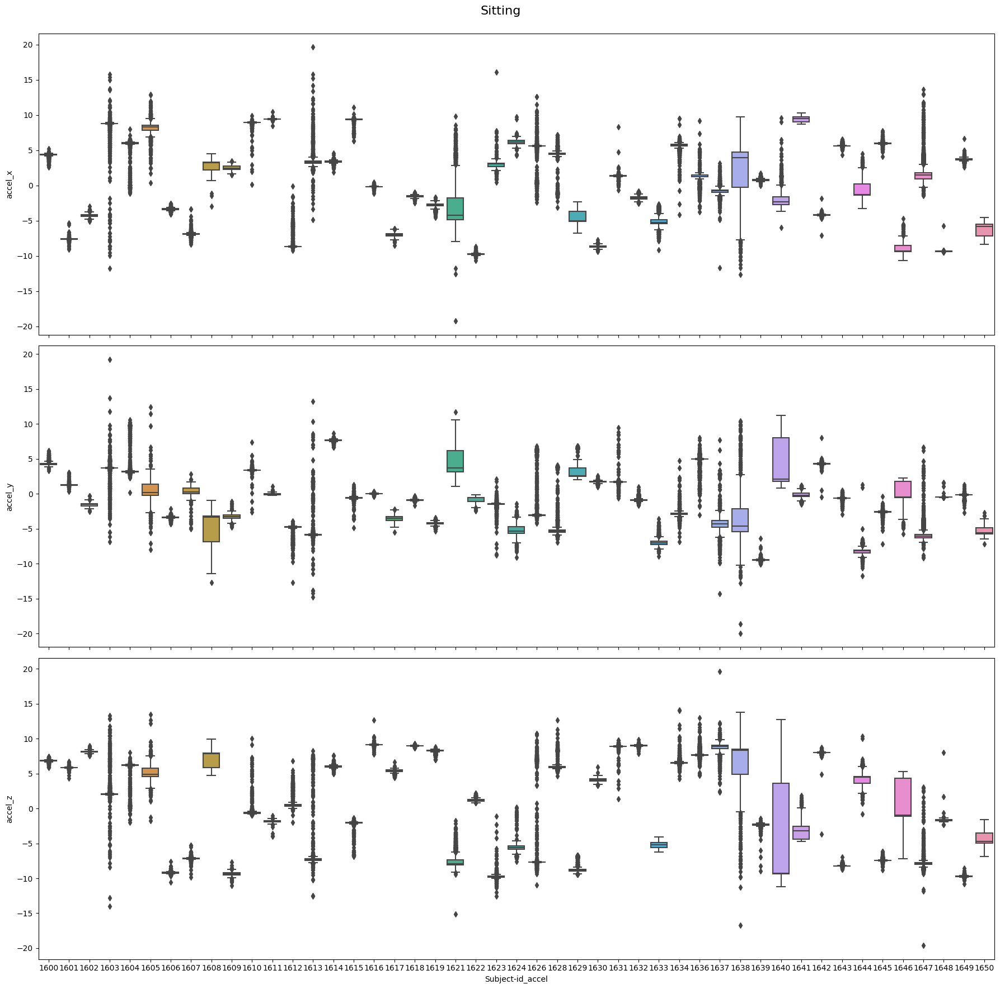

In [31]:
plot_accel(sitting, 'Sitting')

In [32]:
# Check the statistics of acceleration values per subject
selected_columns = ['accel_x', 'accel_y', 'accel_z']
desc_stats_standing = standing.groupby('Subject-id_accel')[selected_columns].describe(percentiles=[])

desc_stats_standing

accel_x                                                      \
                    count      mean       std        min       50%        max   
Subject-id_accel                                                                
1600               3569.0 -2.146414  0.175679  -2.551071 -2.193436  -0.582855   
1601               4510.0  0.861828  0.169212  -0.834978  0.852336   1.876456   
1602               3569.0 -1.178477  1.059643  -6.306045 -1.447662   2.162903   
1603               4510.0  0.711439  0.211477  -1.550246  0.714669   2.979584   
1604               3568.0  1.189038  0.533767  -0.892609  0.899994   3.143051   
1605               4508.0  0.108501  1.135469 -10.691906  0.305859   7.947553   
1606               3569.0 -9.655611  0.311462 -19.703842 -9.651108  -4.393600   
1607               4511.0  2.280187  1.064573 -15.021221  2.407968   6.569689   
1608               3569.0  3.552089  0.161148   2.702042  3.551865   4.594360   
1609               3569.0 -0.075765  0.427890  -7.436417 -0.078796   6.998337   
1610               3569.0 -0.142212  0.236144  -1.072708 -0.180511   1.609009   
1611               3567.0  5.066552  0.792111  -1.368744  5.300461   8.533569   
1612               3569.0 -1.845253  0.382498  -4.398071 -1.821808  -0.557693   
1613               4511.0 -1.984889  0.844815  -5.088876 -1.974019   6.776788   
1614               1614.0  0.788285  0.262488  -0.294587  0.775986   2.014211   
1615               3569.0 -3.134124  0.287542  -5.271500 -3.102875  -1.343918   
1616               3568.0  0.326595  1.477062  -4.483856  0.571083   3.542450   
1617               3569.0 -3.990583  0.506424  -7.326523 -4.000443   1.685074   
1618               3569.0  0.850097  0.709343  -1.130417  1.183212   2.751465   
1619               4511.0 -0.176044  0.135064  -1.697489 -0.161010   0.538097   
1621               4510.0  0.496907  0.738363  -4.370017  0.468964   7.107188   
1622               3570.0 -9.529787  0.045124  -9.849487 -9.528801  -9.267212   
1624               3569.0  3.888674  0.314143   1.995056  3.866608   6.640839   
1626               3567.0  3.640862  0.403621   2.294769  3.717392   4.474686   
1627                 49.0 -1.103557  2.316565  -9.105759 -0.381989   0.997894   
1628               3568.0 -0.952663  0.358133  -2.725632 -1.163910  -0.028839   
1629              14272.0 -0.995244  0.258914  -2.688080 -0.988213   1.191696   
1630               3569.0 -8.981280  0.202904 -11.611984 -8.989288  -7.069946   
1631               3569.0  1.636527  0.185813   1.002121  1.576996   2.661743   
1632               3569.0  1.254629  0.196039  -1.305023  1.283188   2.433395   
1633               3570.0 -4.585184  0.636091  -6.666885 -4.708786   2.703857   
1634               3570.0 -2.647229  0.401073  -4.368698 -2.635757  -0.089020   
1636               3569.0 -4.589292  0.234852  -6.667786 -4.507980  -3.439545   
1637               3598.0 -8.805892  0.583129 -11.364976 -8.865430  -0.698808   
1638               3599.0  3.082706  1.500126  -4.989816  3.449745  13.670592   
1639               3599.0  9.232446  0.288652   3.116951  9.260922  12.344205   
1640               3599.0  9.372339  0.738170  -2.954894  9.418341  12.736704   
1641               1748.0  9.792434  0.191885   8.749006  9.831555  10.842254   
1642               1570.0 -9.189739  0.056228  -9.541759 -9.192085  -7.680828   
1643                237.0  3.465593  0.338930   2.014211  3.477569   5.266648   
1644               1260.0 -0.376286  0.890498  -5.776787 -0.544867   6.466553   
1645               2855.0  0.569743  0.241309  -0.811912  0.553250   2.703977   
1646               2049.0 -8.934917  0.158905 -10.650652 -8.909473  -8.339458   
1647               4511.0  0.798684  1.252578  -1.386243  0.538097  19.612701   
1648               2019.0  3.554189  0.809732 -14.913787  3.436853   9.484278   
1649               4511.0 -1.879924  0.377227  -2.983774 -1.936909   2.012326   
1650                324.0 -7.875054  1.549092 -14

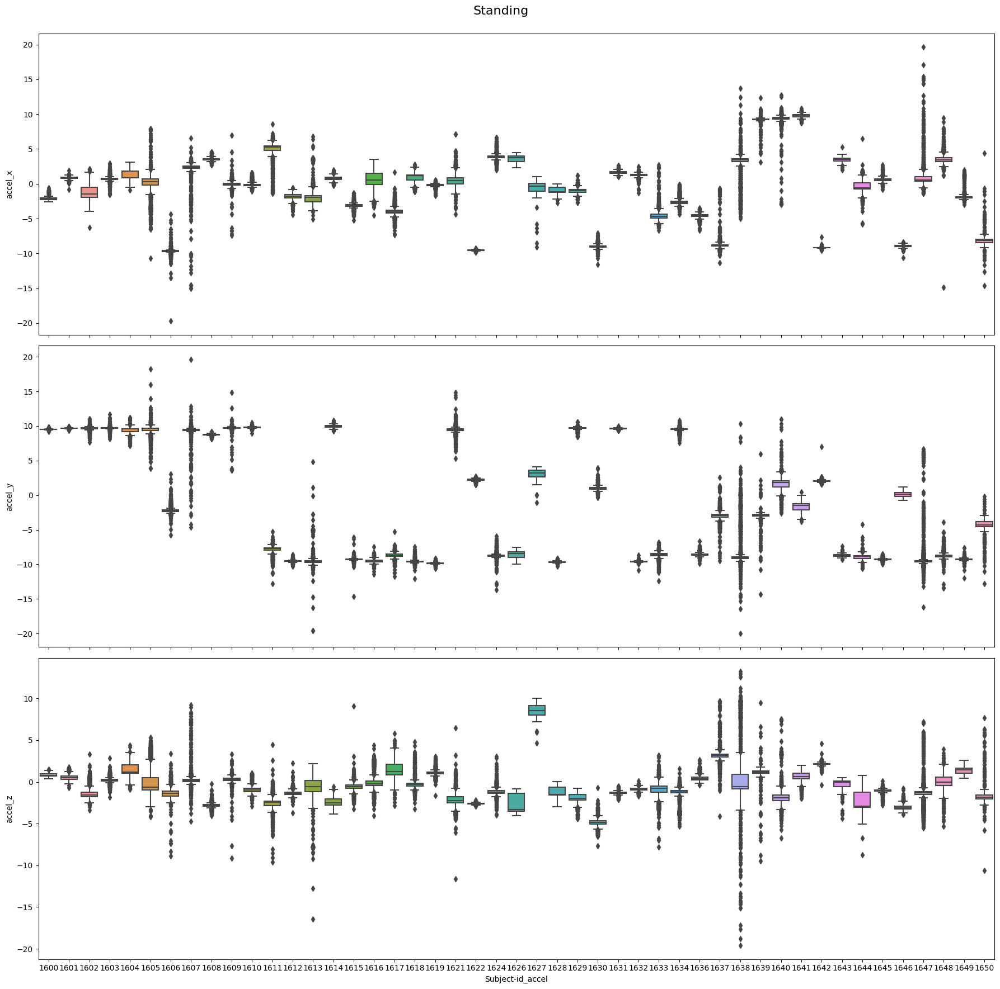

In [33]:
plot_accel(standing, 'Standing')

## Calculating Displacement from Acceleration, Fixing Phone Orientation Issues & creating CSV files

In [34]:
# Function to derive velocity and displacement from acceleration for each observation

def modify_df(df):
    time_differences = []

    for i in range(len(df)):
        difference = (df['DateTime'].iloc[i] - df['DateTime'].iloc[0]).total_seconds() * 1_000_000
        time_differences.append(difference)

    # Add the time differences as a new column in the DataFrame
    df['Time_Difference'] = time_differences

    df['Difference_Microseconds'] = df['Time_Difference'].diff()

    df = df.reset_index(drop = True)

    df['vx'] = 0
    df['vy'] = 0
    df['vz'] = 0

    # Calculate time difference in seconds
    dt = df['Difference_Microseconds'] / 1_000_000

    df['prev_x'] = df['accel_x'].shift(1, fill_value=0)
    df['prev_y'] = df['accel_y'].shift(1, fill_value=0)
    df['prev_z'] = df['accel_z'].shift(1, fill_value=0)

    df['vx'] = 0.5 * (df['prev_x'] + df['accel_x']) * dt
    df['vy'] = 0.5 * (df['prev_y'] - 9.8 + df['accel_y'] - 9.8) * dt
    df['vz'] = 0.5 * (df['prev_z'] + df['accel_z']) * dt

    df = df.fillna(0)

    df.drop(columns=['prev_x', 'prev_y', 'prev_z'], inplace=True)


    # Calculate distance by integrating velocity
    # Initialize distance
    df['dx'] = 0
    df['dy'] = 0
    df['dz'] = 0

    # Calculate time difference in seconds
    dt = df['Difference_Microseconds'] / 1_000_000

    df['prev_dx'] = df['vx'].shift(1, fill_value=0)
    df['prev_dy'] = df['vy'].shift(1, fill_value=0)
    df['prev_dz'] = df['vz'].shift(1, fill_value=0)

    df['dx'] = 0.5 * (df['prev_dx'] + df['vx']) * dt
    df['dy'] = 0.5 * (df['prev_dy'] + df['vy']) * dt
    df['dz'] = 0.5 * (df['prev_dz'] + df['vz']) * dt

    df = df.fillna(0)

    df['Time_secs'] = df['Timestamp_accel']*1e-9
    df['Time_diff'] = df['Time_secs'] - df['Time_secs'].iloc[0]

    df = df[df['Time_diff'] > 15]

    df.drop(columns=['prev_dx', 'prev_dy', 'prev_dz', 'Time_secs'], inplace=True)

    return df

In [35]:
import os

In [36]:
# Function to store a separate dataframe for each subject and modify the acceleration value to calculate
# velocity and displacement and save them as separate csv files in a activity specific folder

def process_subjects(df, activity):
    subject_ids = df['Subject-id_accel'].unique()

    # Create a dictionary to store individual subject dataframes
    subject_dfs = {}

    # Make a separate folder for each activity
    if not os.path.exists(f'wisdm_{activity}'):
        os.makedirs(f'wisdm_{activity}')

    for subject_id in subject_ids:
        subject_df = df[df['Subject-id_accel'] == subject_id].copy()
        subject_df = modify_df(subject_df)
        subject_dfs[subject_id] = subject_df
        # Save the dataframe to a CSV file
        csv_path = os.path.join(f'wisdm_{activity}', f'{activity}_{subject_id}.csv')
        subject_df.to_csv(csv_path, index=False)

    return subject_dfs

In [37]:
# If sitting activity is used this needs to be applied to sitting since the gravity acts on a different axis (z-axis)
# for sitting when compared with other activities where it acts on the y-axis

def modify_df_sitting(df):
    time_differences = []

    for i in range(len(df)):
        difference = (df['DateTime'].iloc[i] - df['DateTime'].iloc[0]).total_seconds() * 1_000_000
        time_differences.append(difference)

    # Add the time differences as a new column in the DataFrame
    df['Time_Difference'] = time_differences

    df['Difference_Microseconds'] = df['Time_Difference'].diff()

    df = df.reset_index(drop = True)

    df['vx'] = 0
    df['vy'] = 0
    df['vz'] = 0

    # Calculate time difference in seconds
    dt = df['Difference_Microseconds'] / 1_000_000

    df['prev_x'] = df['accel_x'].shift(1, fill_value=0)
    df['prev_y'] = df['accel_y'].shift(1, fill_value=0)
    df['prev_z'] = df['accel_z'].shift(1, fill_value=0)

    df['vx'] = 0.5 * (df['prev_x'] + df['accel_x']) * dt
    df['vy'] = 0.5 * (df['prev_y'] + df['accel_y']) * dt
    df['vz'] = 0.5 * (df['prev_z'] - 9.8 + df['accel_z'] - 9.8) * dt

    df = df.fillna(0)

    df.drop(columns=['prev_x', 'prev_y', 'prev_z'], inplace=True)


    # Calculate distance by integrating velocity
    # Initialize distance
    df['dx'] = 0
    df['dy'] = 0
    df['dz'] = 0

    # Calculate time difference in seconds
    dt = df['Difference_Microseconds'] / 1_000_000

    df['prev_dx'] = df['vx'].shift(1, fill_value=0)
    df['prev_dy'] = df['vy'].shift(1, fill_value=0)
    df['prev_dz'] = df['vz'].shift(1, fill_value=0)

    df['dx'] = 0.5 * (df['prev_dx'] + df['vx']) * dt
    df['dy'] = 0.5 * (df['prev_dy'] + df['vy']) * dt
    df['dz'] = 0.5 * (df['prev_dz'] + df['vz']) * dt

    df = df.fillna(0)

    df['Time_secs'] = df['Timestamp_accel']*1e-9
    df['Time_diff'] = df['Time_secs'] - df['Time_secs'].iloc[0]

    df = df[df['Time_diff'] > 15]

    df.drop(columns=['prev_dx', 'prev_dy', 'prev_dz', 'Time_secs'], inplace=True)

    return df

In [38]:
# If sitting activity is used this needs to be applied to sitting since the gravity acts on a different axis (z-axis)
# for sitting when compared with other activities where it acts on the y-axis

def process_subjects_sitting(df, activity):
    subject_ids = df['Subject-id_accel'].unique()

    # Create a dictionary to store individual subject dataframes
    subject_dfs = {}

    if not os.path.exists(f'wisdm_{activity}'):
        os.makedirs(f'wisdm_{activity}')

    for subject_id in subject_ids:
        subject_df = df[df['Subject-id_accel'] == subject_id].copy()
        subject_df = modify_df_sitting(subject_df)
        subject_dfs[subject_id] = subject_df
        # Save the dataframe to a CSV file
        csv_path = os.path.join(f'wisdm_{activity}', f'{activity}_{subject_id}.csv')
        subject_df.to_csv(csv_path, index=False)

    return subject_dfs

In [39]:
# Function to fix orientation

def fix_orientation(df):
    # Step 1: Shift signals where the mean of accel_* columns is negative
    def shift_signals(group):
        for col in ['accel_x', 'accel_y', 'accel_z']:
            mean_value = group[col].mean()
            if mean_value < 0:
                shift_value = 2 * abs(mean_value)
                group[col] += shift_value
        return group

    # Apply the shift_signals function to each group
    df_1 = df.groupby('Subject-id_accel').apply(shift_signals)
    df_1.reset_index(drop=True, inplace=True)

    # Step 2: Swap accel_x and accel_y where mean of accel_x is greater than mean of accel_y
    def swap_columns(group):
        if group['accel_x'].mean() > group['accel_y'].mean():
            group[['accel_x', 'accel_y']] = group[['accel_y', 'accel_x']]
        return group

    # Apply the swap_columns function to each group
    df_1 = df_1.groupby('Subject-id_accel').apply(swap_columns)
    df_1.reset_index(drop=True, inplace=True)

    return df_1

In [40]:
walking

,Subject-id_accel,Activity_accel,Timestamp_accel,accel_x,accel_y,accel_z,Segment_accel,DateTime,gyro_x,gyro_y,gyro_z,accel_magnitude,gyro_magnitude,Roll,Pitch,Yaw
0,1600,A,2.522080e+14,-0.319443,13.318359,-0.232025,1,1970-01-03 22:03:27.968934806,-0.875137,0.015472,0.162231,13.324210,0.890182,52.358906,1.086325,-5.337044e-08
1,1600,A,2.522080e+14,1.566452,9.515274,-0.017776,1,1970-01-03 22:03:28.019288809,-0.720169,0.388489,-0.284012,9.643367,0.866158,68.968681,-3.747721,-1.069504e-07
2,1600,A,2.522081e+14,-0.323746,5.262665,0.322342,1,1970-01-03 22:03:28.069642813,-0.571640,1.227402,-0.241669,5.282458,1.375388,77.119255,-0.331979,-1.334044e-08
3,1600,A,2.522081e+14,-1.811676,3.710510,1.373932,1,1970-01-03 22:03:28.119996817,-0.380493,1.202835,-0.213135,4.351752,1.279458,73.920296,10.959476,-4.348170e-07
4,1600,A,2.522082e+14,-1.134049,4.538269,2.297546,1,1970-01-03 22:03:28.170350821,-0.225784,0.558136,0.124481,5.211590,0.614809,69.002541,11.748578,-4.360212e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
806806,1650,A,3.597864e+14,-7.776629,-4.809199,-0.723296,253,1970-01-05 03:56:26.444225000,1.236772,-0.210922,-0.167247,9.172105,1.265727,-109.688980,61.827854,-1.709451e+02
806807,1650,A,3.597865e+14,-5.022356,-4.854705,-0.601150,253,1970-01-05 03:56:26.484448000,1.221858,-0.605070,-0.288687,7.010963,1.393696,-109.109619,61.448032,-1.704734e+02
806808,1650,A,3.597865e+14,-5.944439,-4.083508,-2.483635,253,1970-01-05 03:56:26.524754000,1.490305,0.524110,0.182160,7.627571,1.590246,-109.479752,61.210403,-1.708768e+02
806809,1650,A,3.597866e+14,-7.220984,-3.173401,-2.945874,253,1970-01-05 03:56:26.565099000,1.100418,0.688161,0.153398,8.419695,1.306911,-110.095505,61.203682,-1.714815e+02


In [41]:
walking_1 = fix_orientation(walking)

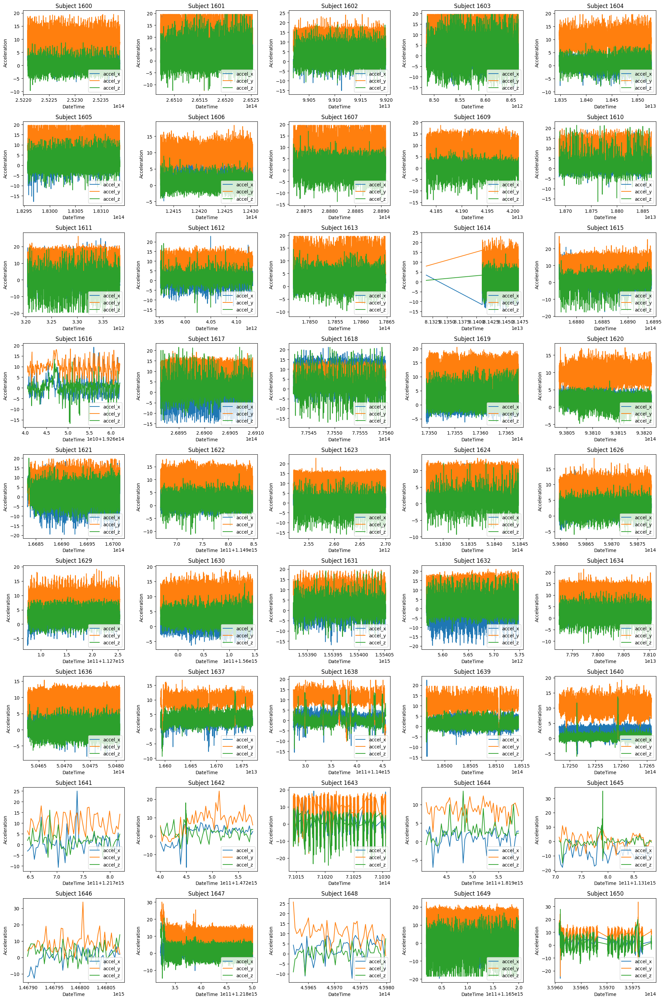

,Subject-id_accel,Activity_accel,Timestamp_accel,accel_x,accel_y,accel_z,Segment_accel,DateTime,gyro_x,gyro_y,gyro_z,accel_magnitude,gyro_magnitude,Roll,Pitch,Yaw
0,1600,A,2.522080e+14,3.400420,13.318359,-0.232025,1,1970-01-03 22:03:27.968934806,-0.875137,0.015472,0.162231,13.324210,0.890182,52.358906,1.086325,-5.337044e-08
1,1600,A,2.522080e+14,5.286315,9.515274,-0.017776,1,1970-01-03 22:03:28.019288809,-0.720169,0.388489,-0.284012,9.643367,0.866158,68.968681,-3.747721,-1.069504e-07
2,1600,A,2.522081e+14,3.396117,5.262665,0.322342,1,1970-01-03 22:03:28.069642813,-0.571640,1.227402,-0.241669,5.282458,1.375388,77.119255,-0.331979,-1.334044e-08
3,1600,A,2.522081e+14,1.908187,3.710510,1.373932,1,1970-01-03 22:03:28.119996817,-0.380493,1.202835,-0.213135,4.351752,1.279458,73.920296,10.959476,-4.348170e-07
4,1600,A,2.522082e+14,2.585815,4.538269,2.297546,1,1970-01-03 22:03:28.170350821,-0.225784,0.558136,0.124481,5.211590,0.614809,69.002541,11.748578,-4.360212e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3563,1600,A,2.523874e+14,1.041106,14.229218,2.887375,1,1970-01-03 22:06:27.380252138,-1.181442,-0.370056,-0.573105,14.764258,1.364257,85.437477,6.806448,6.402157e+00
3564,1600,A,2.523874e+14,0.457763,9.472198,2.704575,1,1970-01-03 22:06:27.430606141,0.057419,-0.680817,-0.428696,10.376828,0.806590,85.436089,6.825107,6.366263e+00
3565,1600,A,2.523875e+14,2.053573,8.423386,1.662826,1,1970-01-03 22:06:27.480960145,-0.220337,-0.125626,-0.218979,8.746139,0.335085,85.261314,6.940444,6.339548e+00
3566,1600,A,2.523875e+14,0.704742,8.867798,-1.034943,1,1970-01-03 22:06:27.531314149,1.026413,-0.133057,-0.229340,9.423370,1.060106,85.311722,6.951326,6.331919e+00


In [42]:
plot_activity_per_subject(walking_1)

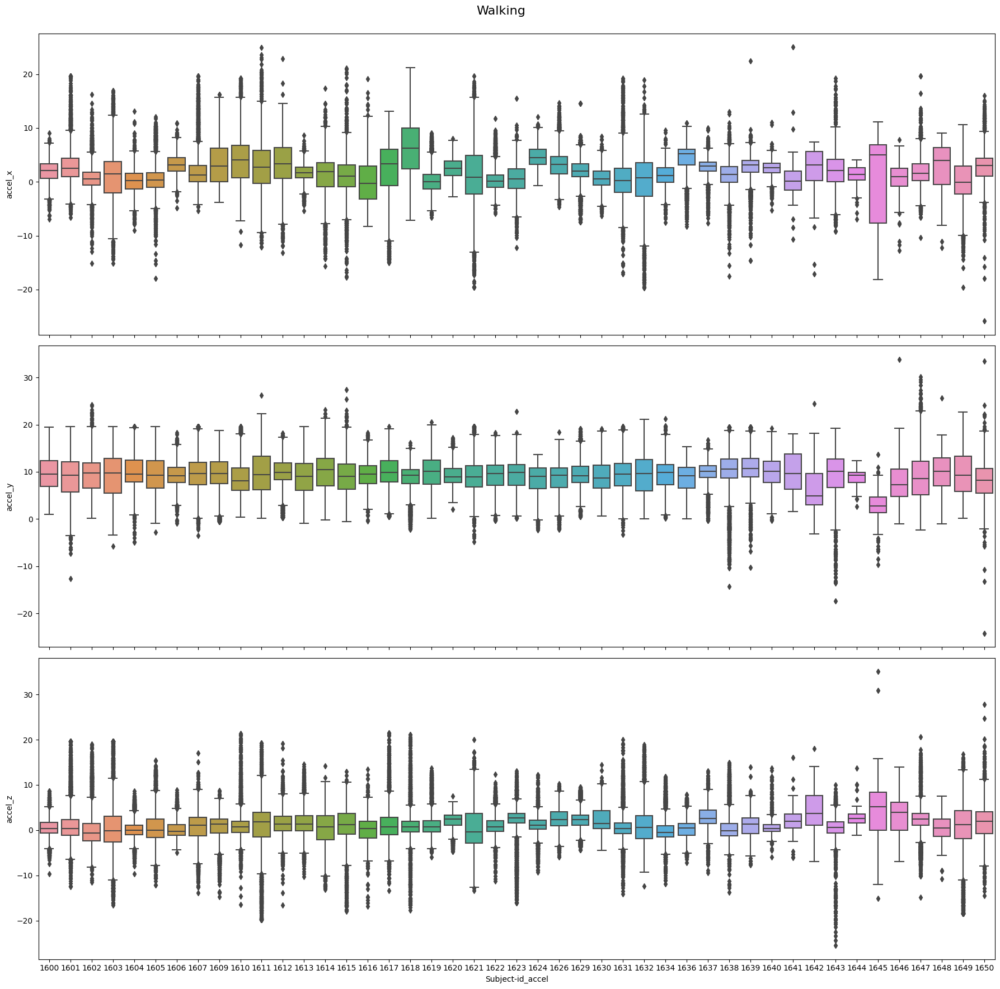

In [43]:
plot_accel(walking_1, 'Walking')

In [44]:
walking_data = process_subjects(walking_1, 'Walking')

In [45]:
jogging_1 = fix_orientation(jogging)

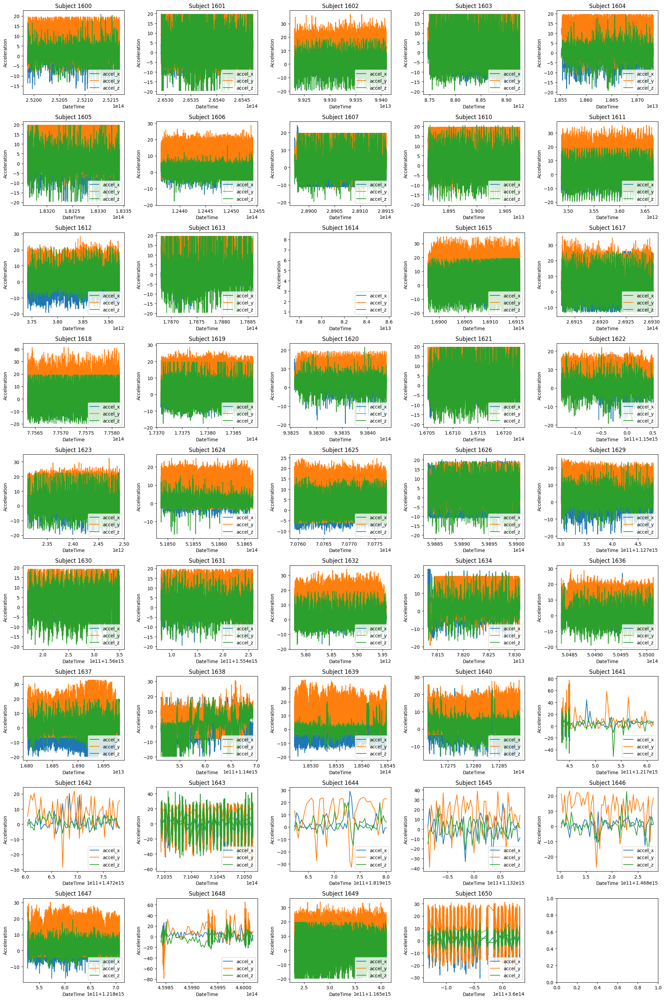

,Subject-id_accel,Activity_accel,Timestamp_accel,accel_x,accel_y,accel_z,Segment_accel,DateTime,gyro_x,gyro_y,gyro_z,accel_magnitude,gyro_magnitude,Roll,Pitch,Yaw
0,1600,B,2.519878e+14,4.181102,3.077148,1.518095,2,1970-01-03 21:59:47.770883934,0.410278,1.710571,0.504745,3.838704,1.830068,85.389954,6.947237,6.409565
1,1600,B,2.519878e+14,-0.416111,-2.738678,0.473310,2,1970-01-03 21:59:47.821237937,-0.256134,0.380859,-0.295776,4.295333,0.546024,85.379318,6.963511,6.427489
2,1600,B,2.519879e+14,0.787059,0.388412,1.911970,2,1970-01-03 21:59:47.871591941,-0.691132,-0.299866,0.030258,1.556634,0.753988,85.342957,6.960790,6.412557
3,1600,B,2.519879e+14,4.157375,3.416168,-4.984057,2,1970-01-03 21:59:47.921945945,0.525040,-0.006882,0.728622,8.533568,0.898112,85.369522,6.924449,6.415183
4,1600,B,2.519880e+14,-4.145878,14.711182,-0.896899,2,1970-01-03 21:59:47.972299949,-1.007584,-0.192322,-1.147400,16.370487,1.539071,85.317406,6.980850,6.400835
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3564,1600,B,2.521672e+14,7.371532,16.525070,5.314191,2,1970-01-03 22:02:47.232541185,-0.105438,-0.495392,-0.715088,17.548298,0.876288,117.990349,18.431906,22.687643
3565,1600,B,2.521673e+14,-0.168034,5.177231,3.213880,2,1970-01-03 22:02:47.282895189,0.299515,-0.950287,-0.467865,5.705601,1.100751,117.200768,18.684311,22.402214
3566,1600,B,2.521673e+14,1.142604,-3.823654,1.987699,2,1970-01-03 22:02:47.333249193,-0.012604,-0.369293,0.340057,3.995127,0.502171,119.509468,20.531807,23.154453
3567,1600,B,2.521674e+14,0.535411,-3.183289,0.864912,2,1970-01-03 22:02:47.383603197,-0.869431,-1.190262,0.539185,3.953372,1.569507,121.956764,22.186232,24.000301


In [46]:
plot_activity_per_subject(jogging_1)

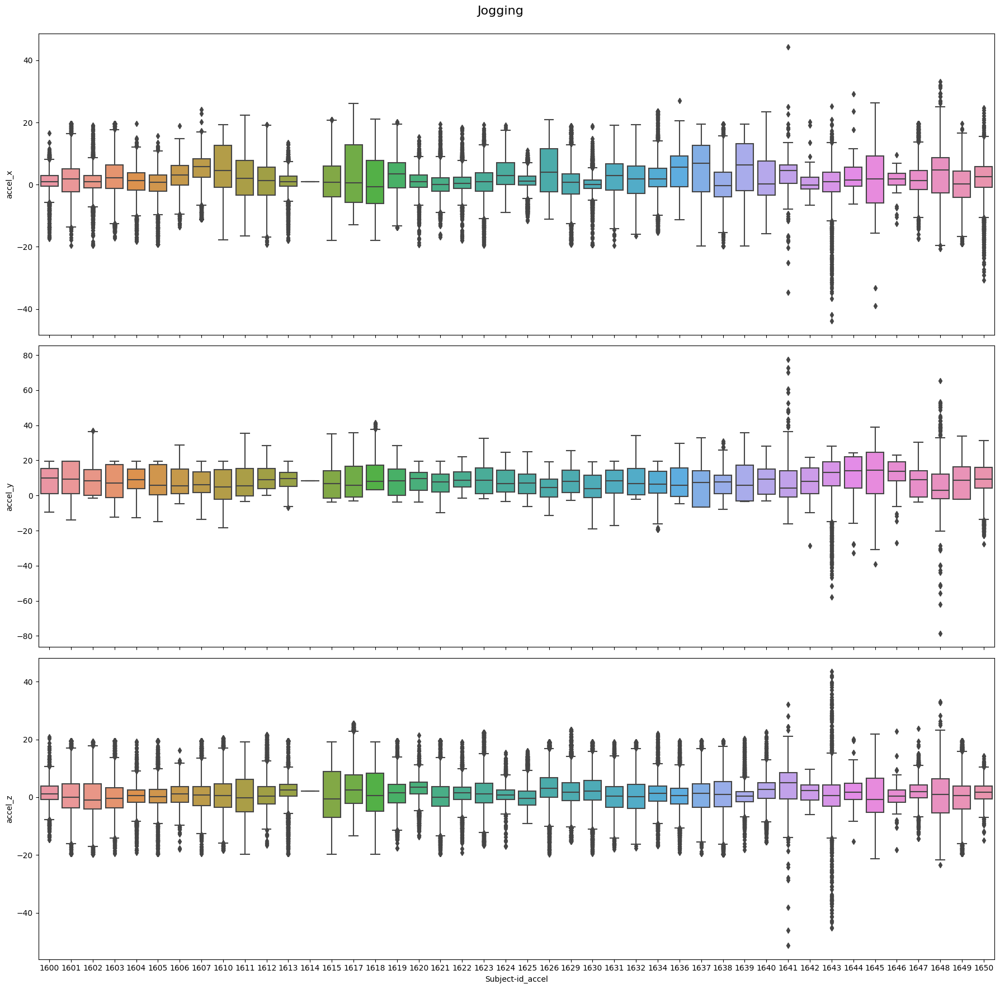

In [47]:
plot_accel(jogging_1, 'Jogging')

In [48]:
selected_columns = ['accel_x', 'accel_y', 'accel_z']
desc_stats_jog1 = jogging_1.groupby('Subject-id_accel')[selected_columns].describe(percentiles=[])

desc_stats_jog1

accel_x                                            \
                    count      mean        std        min       50%   
Subject-id_accel                                                      
1600               3569.0  1.071180   3.543143 -17.424153  1.001598   
1601               4510.0  1.898086   5.943487 -19.613300  1.789965   
1602               3569.0  0.734773   4.416307 -19.564468  0.873703   
1603               4511.0  2.155451   7.057655 -17.192762  2.277484   
1604               3569.0  0.755252   4.481164 -18.214410  1.260856   
1605               4510.0  0.247470   4.379748 -19.118361  0.702038   
1606               3569.0  2.835142   4.318612 -13.657644  3.087504   
1607               4510.0  4.265789   5.740283 -11.081722  5.802487   
1610               3270.0  5.618968   8.211240 -17.745285  4.625496   
1611               3569.0  1.603560   7.059987 -16.542132  2.010449   
1612               3569.0  1.237236   7.085144 -19.234833  1.306900   
1613               4510.0  0.855315   3.267603 -17.902670  1.036962   
1614                  1.0  0.924478        NaN   0.924478  0.924478   
1615               3569.0  0.911899   7.483864 -17.925455  0.798712   
1617               3569.0  3.419065  11.197901 -12.911122  0.590953   
1618               3569.0  0.931295   9.763064 -17.886661 -0.746448   
1619               4511.0  2.935266   5.650579 -13.742769  3.440417   
1620               3569.0  1.163392   3.450491 -19.414260  0.927521   
1621               4510.0  0.097899   3.988545 -16.931196  0.138564   
1622               3568.0  0.659360   3.669762 -17.978385  0.456834   
1623               3569.0  0.691835   5.238122 -19.475647  0.983170   
1624               3568.0  3.531209   4.703973  -8.859894  2.890511   
1625               3567.0  1.053038   3.267823 -11.677889  1.191831   
1626               8414.0  4.120735   8.054956 -11.144884  3.947478   
1629              14280.0  0.133254   5.200942 -19.139725  0.717987   
1630               3569.0  0.124868   3.420079 -19.386353  0.084946   
1631               3569.0  2.644500   5.983914 -19.489655  2.916611   
1632               3569.0  2.089545   6.085717 -16.567780  1.789642   
1634               3569.0  2.185789   5.680696 -15.377674  1.861736   
1636               3569.0  4.215029   6.306833 -11.319194  5.661275   
1637               3598.0  4.909007  10.723979 -19.673454  6.817190   
1638               3599.0  0.124239   6.157685 -19.715353 -0.391751   
1639               3599.0  5.595731   9.766951 -19.714155  6.291663   
1640               3599.0  1.966346   7.100054 -15.793137  0.274351   
1641                292.0  3.170243   7.246949 -34.611956  4.487939   
1642                 56.0  1.094481   5.074297  -6.605464 -0.052690   
1643               2195.0  0.183751   7.033346 -43.879154  0.993933   
1644                 57.0  3.196679   6.273721  -6.195916  1.551973   
1645                 55.0  0.880845  11.982003 -38.926254  1.927991   
1646                 55.0  1.132017   4.239871 -12.541977  1.902386   
1647               4511.0  1.908711   5.436865 -17.337013  1.286285   
1648                653.0  3.618163   9.479327 -20.580404  4.806804   
1649               4511.0  0.278782   6.125270 -19.055735  0.276246   
1650               1896.0  1.611320   7.110781 -30.664495  2.639453   

                             accel_y                                   \
                        max    count       mean        std        min   
Subject-id_accel                                                        
1600              16.581493   3569.0   8.403181   7.627909  -9.483810   
1601              19.612701   4510.0   8.472193   9.640747 -14.055161   
1602              19.044586   3569.0   8.939611   8.976363  -1.507130   
1603              19.612701   4511.0   7.287494   9.368065 -12.397177   
1604              19.636253   3569.0   8.748080   7.190325 -12.615936   
1605              15.744209   4510.0   7.732515   8.703811 -14.879365   
1606              18.88

In [49]:
jogging_data = process_subjects(jogging_1, 'Jogging')

In [50]:
stairs_1 = fix_orientation(stairs)

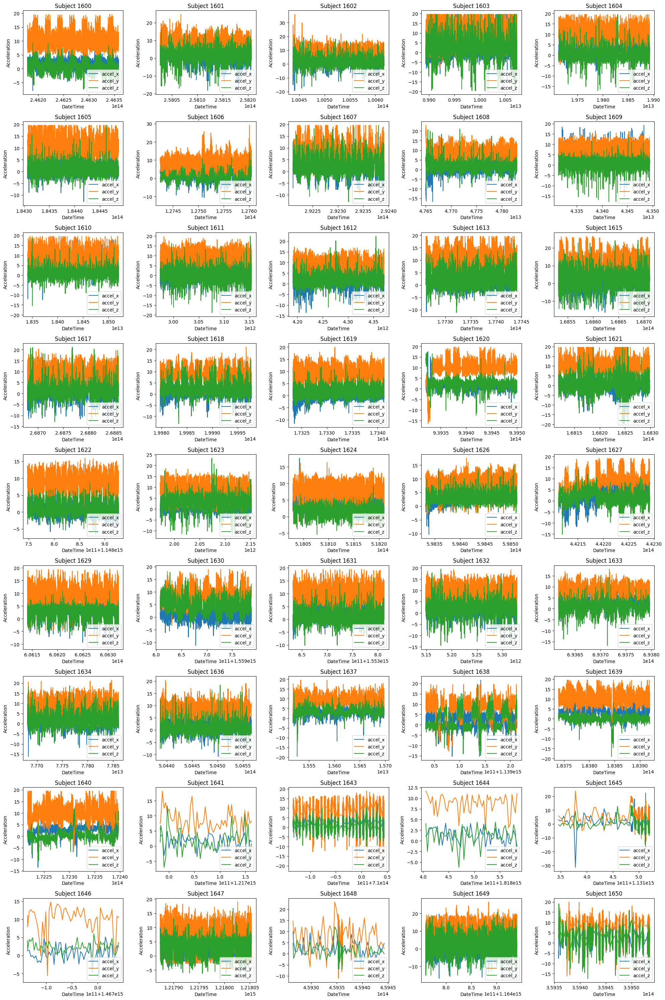

,Subject-id_accel,Activity_accel,Timestamp_accel,accel_x,accel_y,accel_z,Segment_accel,DateTime,gyro_x,gyro_y,gyro_z,accel_magnitude,gyro_magnitude,Roll,Pitch,Yaw
0,1600,C,2.461791e+14,2.750585,7.639664,1.324072,3,1970-01-03 20:22:59.075558139,0.775452,0.192520,-0.038300,7.729054,0.799910,120.154388,22.592243,23.298424
1,1600,C,2.461791e+14,1.316442,7.922516,1.904959,3,1970-01-03 20:22:59.125912143,0.706696,0.048828,0.135925,8.256946,0.721303,119.472511,22.492115,23.022240
2,1600,C,2.461792e+14,3.229894,7.312866,1.394720,3,1970-01-03 20:22:59.176266147,0.666214,-0.171661,0.447998,7.357316,0.820982,118.870232,22.048664,22.764151
3,1600,C,2.461792e+14,3.854207,9.323654,1.117911,3,1970-01-03 20:22:59.226620151,0.445953,0.095047,0.216721,9.377100,0.504853,118.293175,21.509588,22.540682
4,1600,C,2.461793e+14,3.238774,10.668884,2.016836,3,1970-01-03 20:22:59.276974154,0.093506,0.069366,0.160019,10.676511,0.197892,117.580132,21.084929,22.279293
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3561,1600,C,2.463585e+14,3.200154,12.906448,-1.094477,3,1970-01-03 20:25:58.537210658,0.345963,0.168716,0.334915,13.301408,0.510219,99.796127,13.954967,24.148481
3562,1600,C,2.463586e+14,2.619695,13.062683,-3.745600,3,1970-01-03 20:25:58.587564662,0.029602,0.124725,0.148087,14.344243,0.195863,99.798828,13.946606,24.153517
3563,1600,C,2.463586e+14,0.696599,11.423859,-2.432505,3,1970-01-03 20:25:58.637918666,-0.236267,0.161514,-0.176697,12.634137,0.336349,99.789360,13.953939,24.163265
3564,1600,C,2.463587e+14,0.718862,8.363022,-1.039499,3,1970-01-03 20:25:58.688272669,-0.604233,-0.137955,-0.123047,9.394581,0.631878,99.757713,13.961170,24.157333


In [51]:
plot_activity_per_subject(stairs_1)

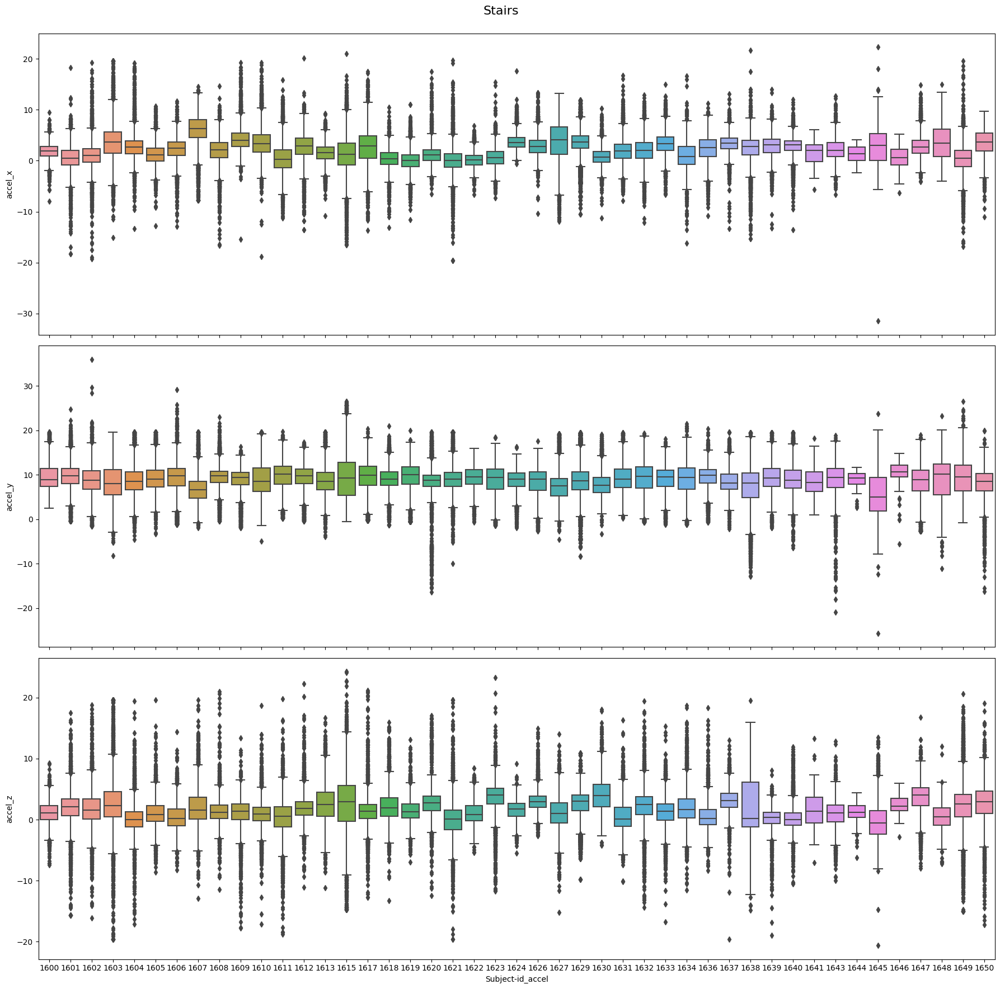

In [52]:
plot_accel(stairs_1, 'Stairs')

In [53]:
stairs_data = process_subjects(stairs_1, 'Stairs')

In [54]:
standing_1 = fix_orientation(standing)

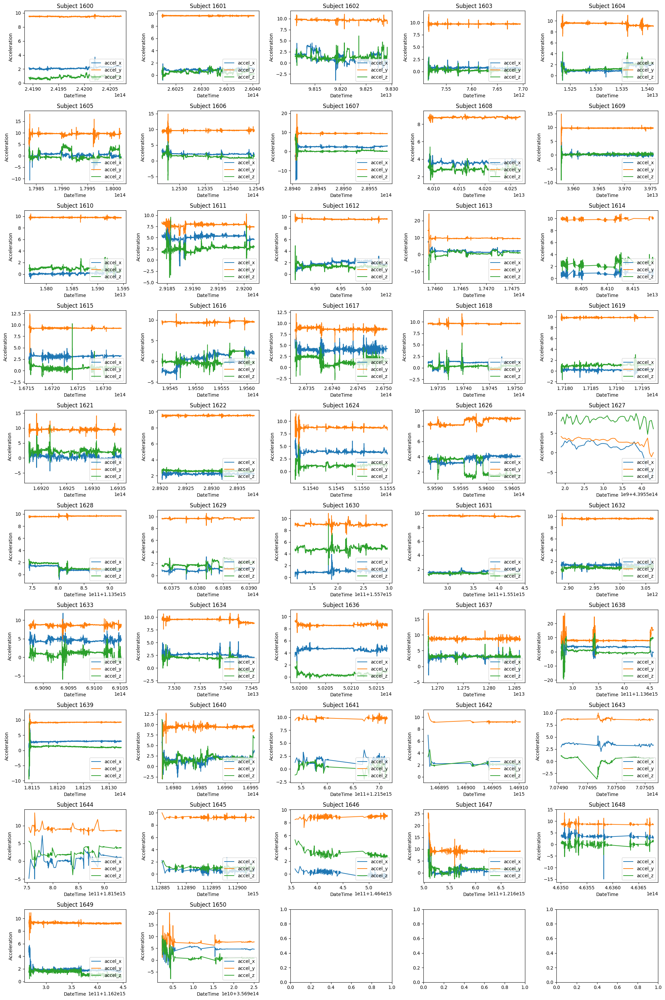

,Subject-id_accel,Activity_accel,Timestamp_accel,accel_x,accel_y,accel_z,Segment_accel,DateTime,gyro_x,gyro_y,gyro_z,accel_magnitude,gyro_magnitude,Roll,Pitch,Yaw
0,1600,E,2.418924e+14,2.128765,9.516312,0.745926,5,1970-01-03 19:11:32.437845993,-0.017975,-0.032074,-0.007080,9.787735,0.037443,32.446800,-28.379389,33.133686
1,1600,E,2.418925e+14,2.189266,9.523972,0.752823,5,1970-01-03 19:11:32.488199997,-0.007645,-0.034332,-0.007858,9.782523,0.036040,32.447098,-28.380627,33.132263
2,1600,E,2.418925e+14,2.191661,9.550766,0.782501,5,1970-01-03 19:11:32.538554001,-0.007095,-0.019287,-0.002594,9.810420,0.020714,32.447079,-28.381372,33.131554
3,1600,E,2.418926e+14,2.192058,9.512314,0.808243,5,1970-01-03 19:11:32.588908005,-0.008926,0.009628,0.004044,9.774999,0.013738,32.446400,-28.381071,33.132034
4,1600,E,2.418926e+14,2.153560,9.506989,0.760040,5,1970-01-03 19:11:32.639262009,-0.014465,0.026794,0.006287,9.774301,0.031092,32.445152,-28.380117,33.133160
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3564,1600,E,2.420719e+14,2.310848,9.554260,0.803116,5,1970-01-03 19:14:31.899508903,-0.012146,0.013824,0.007645,9.790665,0.019927,84.854362,11.399417,24.824551
3565,1600,E,2.420719e+14,2.353237,9.525787,0.786530,5,1970-01-03 19:14:31.949862907,-0.014297,0.014954,0.007614,9.753013,0.022045,84.864441,11.400902,24.827446
3566,1600,E,2.420720e+14,2.302425,9.557068,0.768784,5,1970-01-03 19:14:32.000216911,-0.017517,0.023148,0.004562,9.792358,0.029385,84.877190,11.408956,24.831287
3567,1600,E,2.420721e+14,2.334880,9.513092,0.797928,5,1970-01-03 19:14:32.050570915,-0.018204,0.015182,0.007523,9.745212,0.024869,84.884659,11.413192,24.833723


In [55]:
plot_activity_per_subject(standing_1)

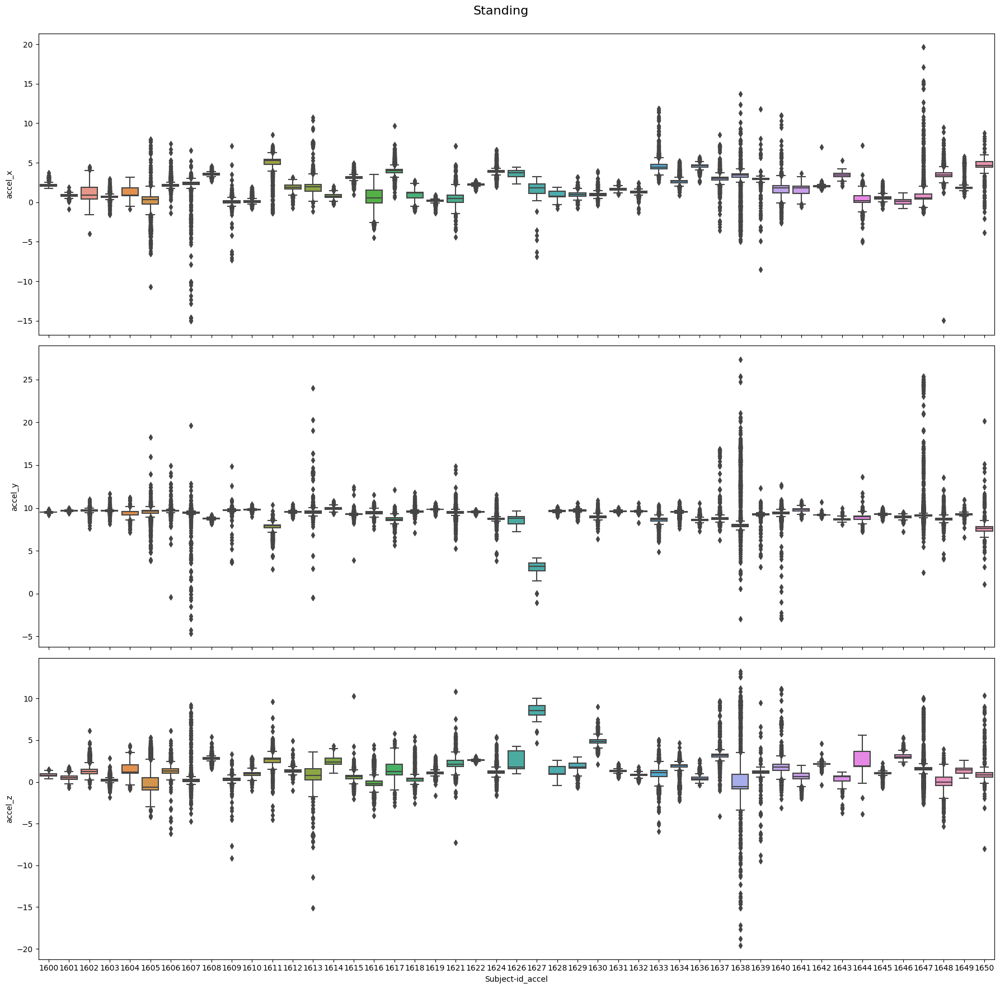

In [56]:
plot_accel(standing_1, 'Standing')

In [57]:
process_subjects(standing_1, 'Standing')

{'1600':      Subject-id_accel Activity_accel  Timestamp_accel   accel_x   accel_y  \
 298              1600              E     2.419074e+14  2.000011  9.494690   
 299              1600              E     2.419075e+14  1.964336  9.515350   
 300              1600              E     2.419075e+14  1.961376  9.529297   
 301              1600              E     2.419076e+14  1.999462  9.525314   
 302              1600              E     2.419076e+14  2.001461  9.513306   
 ...               ...            ...              ...       ...       ...   
 3564             1600              E     2.420719e+14  2.310848  9.554260   
 3565             1600              E     2.420719e+14  2.353237  9.525787   
 3566             1600              E     2.420720e+14  2.302425  9.557068   
 3567             1600              E     2.420721e+14  2.334880  9.513092   
 3568             1600              E     2.420721e+14  2.384288  9.503586   
 
        accel_z  Segment_accel                      Da

In [58]:
# If sitting activity is used this needs to be applied to sitting since the gravity acts on a different axis (z-axis)
# for sitting when compared with other activities where it acts on the y-axis

def fix_orientation_sitting(df):
    # Step 1: Shift signals where the mean of accel_* columns is negative
    def shift_signals(group):
        for col in ['accel_x', 'accel_y', 'accel_z']:
            mean_value = group[col].mean()
            if mean_value < 0:
                shift_value = 2 * abs(mean_value)
                group[col] += shift_value
        return group

    # Apply the shift_signals function to each group
    df_1 = df.groupby('Subject-id_accel').apply(shift_signals)
    df_1.reset_index(drop=True, inplace=True)

    # Step 2: Swap accel_x and accel_y where mean of accel_x is greater than mean of accel_y
    def swap_columns(group):
        if group['accel_x'].mean() > group['accel_z'].mean():
            group[['accel_x', 'accel_z']] = group[['accel_z', 'accel_x']]
        return group

    # Apply the swap_columns function to each group
    df_1 = df_1.groupby('Subject-id_accel').apply(swap_columns)
    df_1.reset_index(drop=True, inplace=True)

    return df_1

In [59]:
sitting_1 = fix_orientation_sitting(sitting)

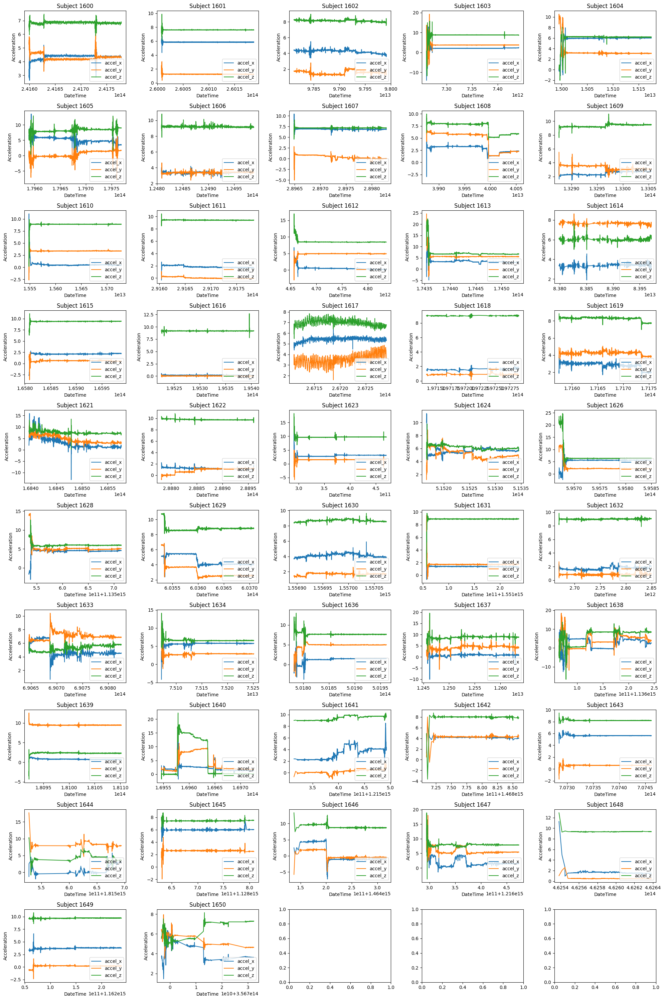

,Subject-id_accel,Activity_accel,Timestamp_accel,accel_x,accel_y,accel_z,Segment_accel,DateTime,gyro_x,gyro_y,gyro_z,accel_magnitude,gyro_magnitude,Roll,Pitch,Yaw
0,1600,D,2.415988e+14,3.441956,5.564392,6.766052,4,1970-01-03 19:06:38.773279024,-0.017044,-0.009857,-0.052841,9.412172,0.056390,99.714874,13.976588,24.164312
1,1600,D,2.415988e+14,3.074692,5.422821,6.502975,4,1970-01-03 19:06:38.823633028,-0.103119,0.044037,-0.071426,9.008297,0.132945,99.710419,13.979737,24.167173
2,1600,D,2.415989e+14,2.887711,5.243088,6.641632,4,1970-01-03 19:06:38.873987032,-0.271332,-0.010986,-0.096573,8.940924,0.288215,99.696915,13.984590,24.167454
3,1600,D,2.415989e+14,3.004990,5.246551,6.692841,4,1970-01-03 19:06:38.924341036,-0.243042,-0.103088,-0.098358,9.019445,0.281729,99.683716,13.990307,24.163074
4,1600,D,2.415990e+14,2.988358,5.451782,6.638504,4,1970-01-03 19:06:38.974695040,-0.085510,-0.091629,-0.073547,9.095160,0.145317,99.678474,13.994702,24.159060
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3564,1600,D,2.417782e+14,4.365356,4.304474,6.787476,4,1970-01-03 19:09:38.234967618,-0.000107,-0.004028,-0.000320,9.146292,0.004042,32.484798,-28.413036,33.117546
3565,1600,D,2.417783e+14,4.361466,4.303711,6.867676,4,1970-01-03 19:09:38.285321622,-0.008438,0.007751,-0.005997,9.203765,0.012932,32.474110,-28.409395,33.122391
3566,1600,D,2.417783e+14,4.322098,4.285400,6.844696,4,1970-01-03 19:09:38.335675626,-0.007797,0.006805,0.000870,9.159424,0.010386,32.462990,-28.402817,33.127686
3567,1600,D,2.417784e+14,4.300400,4.312668,6.874374,4,1970-01-03 19:09:38.386029630,-0.004303,0.002808,0.000031,9.184202,0.005138,32.453671,-28.390642,33.132084


In [60]:
plot_activity_per_subject(sitting_1)

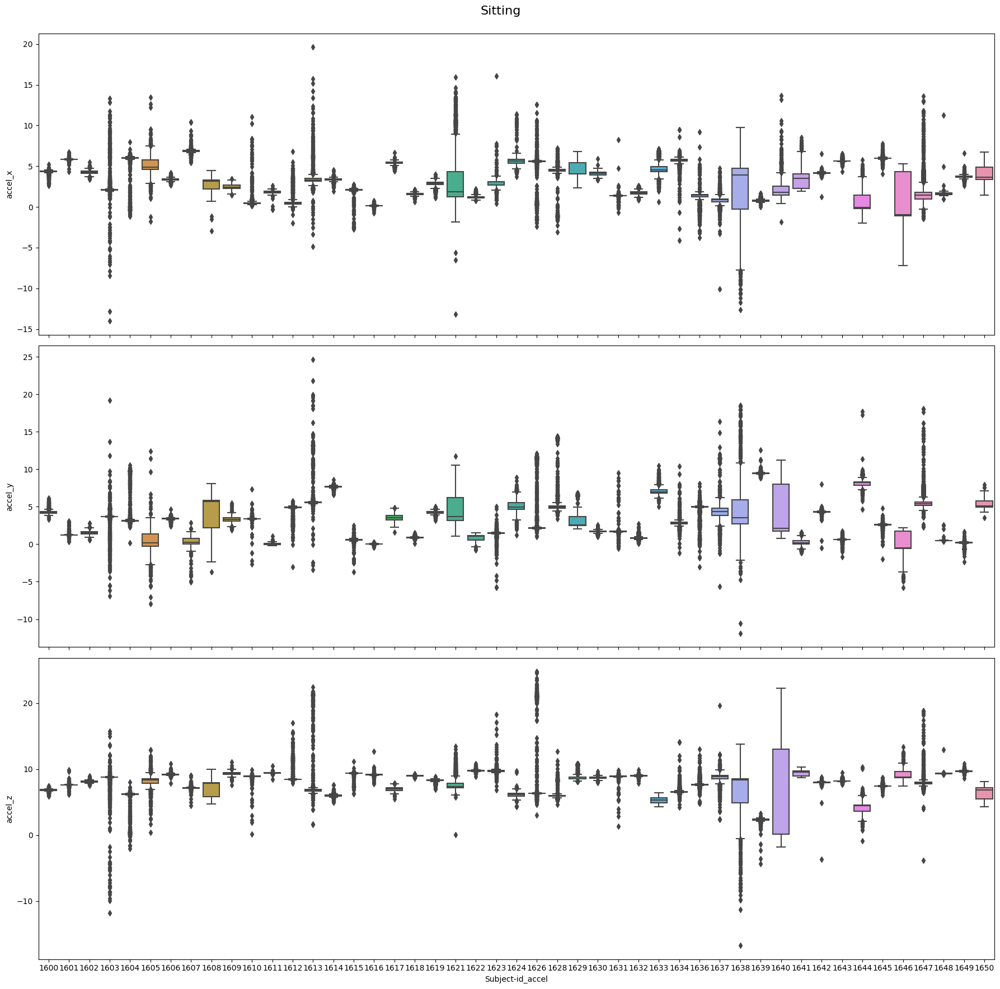

In [61]:
plot_accel(sitting_1, 'Sitting')

In [62]:
process_subjects_sitting(sitting_1, 'Sitting')

{'1600':      Subject-id_accel Activity_accel  Timestamp_accel   accel_x   accel_y  \
 298              1600              D     2.416138e+14  4.081863  4.644699   
 299              1600              D     2.416138e+14  4.069199  4.601227   
 300              1600              D     2.416139e+14  4.094482  4.568924   
 301              1600              D     2.416139e+14  4.105728  4.607254   
 302              1600              D     2.416140e+14  4.122467  4.624695   
 ...               ...            ...              ...       ...       ...   
 3564             1600              D     2.417782e+14  4.365356  4.304474   
 3565             1600              D     2.417783e+14  4.361466  4.303711   
 3566             1600              D     2.417783e+14  4.322098  4.285400   
 3567             1600              D     2.417784e+14  4.300400  4.312668   
 3568             1600              D     2.417784e+14  4.289719  4.318375   
 
        accel_z  Segment_accel                      Da

In [63]:
walking_data

{'1600':      Subject-id_accel Activity_accel  Timestamp_accel   accel_x    accel_y  \
 298              1600              A     2.522230e+14 -4.461991  16.172333   
 299              1600              A     2.522230e+14  3.923415  14.462021   
 300              1600              A     2.522231e+14  4.168258   8.281036   
 301              1600              A     2.522231e+14  2.734786   2.958115   
 302              1600              A     2.522232e+14  2.341857   1.817352   
 ...               ...            ...              ...       ...        ...   
 3563             1600              A     2.523874e+14  1.041106  14.229218   
 3564             1600              A     2.523874e+14  0.457763   9.472198   
 3565             1600              A     2.523875e+14  2.053573   8.423386   
 3566             1600              A     2.523875e+14  0.704742   8.867798   
 3567             1600              A     2.523876e+14 -1.871003   7.878555   
 
        accel_z  Segment_accel            

In [455]:
walking_data['1600']

,Subject-id_accel,Activity_accel,Timestamp_accel,accel_x,accel_y,accel_z,Segment_accel,DateTime,gyro_x,gyro_y,...,Yaw,Time_Difference,Difference_Microseconds,vx,vy,vz,dx,dy,dz,Time_diff
298,1600,A,2.522230e+14,-4.461991,16.172333,-1.663879,1,1970-01-03 22:03:42.974438788,-0.558990,0.035126,...,0.964633,15005503.0,50354.0,-0.112006,0.276432,-0.206099,0.000604,0.009955,-0.009399,15.005504
299,1600,A,2.522230e+14,3.923415,14.462021,-1.146256,1,1970-01-03 22:03:43.024792792,-0.817642,0.048782,...,0.981411,15055857.0,50354.0,-0.013560,0.277812,-0.070751,-0.003161,0.013954,-0.006970,15.055858
300,1600,A,2.522231e+14,4.168258,8.281036,-0.226364,1,1970-01-03 22:03:43.075146795,-0.929611,0.372192,...,1.006359,15106211.0,50354.0,0.203724,0.079133,-0.034558,0.004788,0.008987,-0.002651,15.106212
301,1600,A,2.522231e+14,2.734786,2.958115,-0.569778,1,1970-01-03 22:03:43.125500799,-0.489822,1.487793,...,1.080814,15156565.0,50354.0,0.173798,-0.210501,-0.020044,0.009505,-0.003307,-0.001375,15.156566
302,1600,A,2.522232e+14,2.341857,1.817352,0.341766,1,1970-01-03 22:03:43.175854803,-0.235107,1.501343,...,1.155926,15206919.0,50354.0,0.127815,-0.373237,-0.005741,0.007594,-0.014697,-0.000649,15.206920
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3563,1600,A,2.523874e+14,1.041106,14.229218,2.887375,1,1970-01-03 22:06:27.380252138,-1.181442,-0.370056,...,6.402157,179411317.0,50354.0,-0.020105,0.257562,0.217379,0.000257,0.009951,0.010397,179.411317
3564,1600,A,2.523874e+14,0.457763,9.472198,2.704575,1,1970-01-03 22:06:27.430606141,0.057419,-0.680817,...,6.366263,179461671.0,50354.0,0.037737,0.103261,0.140789,0.000444,0.009084,0.009018,179.461671
3565,1600,A,2.523875e+14,2.053573,8.423386,1.662826,1,1970-01-03 22:06:27.480960145,-0.220337,-0.125626,...,6.339548,179512025.0,50354.0,0.063228,-0.042912,0.109958,0.002542,0.001519,0.006313,179.512025
3566,1600,A,2.523875e+14,0.704742,8.867798,-1.034943,1,1970-01-03 22:06:27.531314149,1.026413,-0.133057,...,6.331919,179562379.0,50354.0,0.069446,-0.058129,0.015808,0.003340,-0.002544,0.003166,179.562379
